## Summary

A recommendation system was built for a startup looking to start a quarterly book subscribtion business. The data was obtained from the Book-Crossing Community and cleaned for outliers and then further processed using different packagess, including paandas, numpy, sci-kit learn and pycountry. The data was filtered for US users and books with number of ratings greater than 19. The data with missing raatings waasas set aside to use for reecommending new books that users haven't rated yet while the rest was used to model KNN, SVD and NMF algorithms. These aalgorithms were evaluated and compared based on differet metrics. RMSE was chosen as the main metric for comparison through which SVD was chosen as the final model.

## Problem Overview

A startup is planning on launching a books care package monthly subscription system where the user will be deliverd 5 books every quarter. The user will have the option to return whichever books they do not intend to keep within 7 days of receiving. Therefore it is crucial to ensure that the books delivered match the customer's preference otherwise returns can cause significant losses.

The intention is to use the ratings that users have given previous books to compute the 5 books that will be delivered. The task s to build a recommendation system that can take in certain features of the user and their history of book ratings and recommend the Top 5 books for that user.

## Data Sources

The following dataset is used to create a recommendation system. 
1. Ratings: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Ratings.csv 
2. Books: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Books.csv 
3. Users: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Users.csv 

This dataset contains data on more than 200,000 users with demographic information and collected from the reputable Book-Crossing community. It has also been cleaned to a certain extent which gives us leverage to focus more on the modelling part. This dataset contains features that are readilly available and will not make it extremely difficult for the company to expand the dataset. 

A recommendaation system based on less complicated data might not be highly accurate but it provides the option to add more features as needed. It is more difficult to unwind a complex model as compared to one using simple features.

## Initial Data Understanding and Data Cleaning

The Book-Crossing dataset comprises 3 files.

* Books

Books are identified by their respective ISBN. Invalid ISBNs have already been removed from the dataset. Moreover, some content-based information is given (`Book-Title`, `Book-Author`, `Year-Of-Publication`, `Publisher`), obtained from Amazon Web Services. Note that in case of several authors, only the first is provided. URLs linking to cover images are also given, appearing in three different flavours (`Image-URL-S`, `Image-URL-M`, `Image-URL-L`), i.e., small, medium, large. These URLs point to the Amazon web site.
<br>

* Ratings

Contains the book rating information. Ratings (`Book-Rating`) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.
<br>

* Users

Contains the users. Note that user IDs (`User-ID`) have been anonymized and map to integers. Demographic data is provided (`Location`, `Age`) if available. Otherwise, these fields contain NULL-values.

In [ ]:
## import initial libraries
import pandas as pd
import numpy as numpy
from plotly import express as px

### Books

First load the dataset and preview the dataset.

In [186]:
#load the dataset into a pandas dataframe
books = pd.read_csv("data/Books.csv")

#preview the dataset
books.head()

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_5986/3637232235.py:2: DtypeWarning:



Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.




,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


The ISBN is the unique identifier for every book but for recommendations, we have to look at the book titles and authors. Considering that book titles are extracted from Amazon's database, there is hiigh cconfidence that they are correct. 

Image URLs won't be useful for analysis so it can be dropped. Year of Publication and Publisher are also unique charaacteristics to explore in the Exploratory Data Analysis section to understand ppulraity of individul data points.

First, lets look at the info of the books dataframe to understand the characteristics of the dataset.

In [187]:
#look at the info
books.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 271360 entries, 0 to 271359

Data columns (total 8 columns):

 #   Column               Non-Null Count   Dtype 

---  ------               --------------   ----- 

 0   ISBN                 271360 non-null  object

 1   Book-Title           271360 non-null  object

 2   Book-Author          271359 non-null  object

 3   Year-Of-Publication  271360 non-null  object

 4   Publisher            271358 non-null  object

 5   Image-URL-S          271360 non-null  object

 6   Image-URL-M          271360 non-null  object

 7   Image-URL-L          271357 non-null  object

dtypes: object(8)

memory usage: 16.6+ MB


In [188]:
#check number of missing values
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            3
dtype: int64

There are very few missing values in the relevant columns. 2 in the Publisher column and 1 in the Book Author column. Considering that there are more than 250,000+ records, dropping the rows with missing data won't impact the data.

All of the columns are stored as strings. Year of Publication is also stored as a string. This will need to be changed to datetime format for proper analysis later.

In [189]:
#drop the Image URL columns
books.drop(["Image-URL-S","Image-URL-M","Image-URL-L"],axis = 1,inplace = True)

#drop the records with missing values
books.dropna(inplace = True)

#check info for the new dataset
books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 271357 entries, 0 to 271359

Data columns (total 5 columns):

 #   Column               Non-Null Count   Dtype 

---  ------               --------------   ----- 

 0   ISBN                 271357 non-null  object

 1   Book-Title           271357 non-null  object

 2   Book-Author          271357 non-null  object

 3   Year-Of-Publication  271357 non-null  object

 4   Publisher            271357 non-null  object

dtypes: object(5)

memory usage: 12.4+ MB


Next, explore the year of publication before it is transformed to datetime format. We will cross-check whether the values stored in here are valid.

In [190]:
#check unique values for year of publication
books["Year-Of-Publication"].unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984, 0, 1968, 1961, 1958, 1974,
       1976, 1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960,
       1966, 1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954,
       1950, 1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011,
       1925, 1948, 1943, 1947, 1945, 1923, 2020, 1939, 1926, 1938, 2030,
       1911, 1904, 1949, 1932, 1928, 1929, 1927, 1931, 1914, 2050, 1934,
       1910, 1933, 1902, 1924, 1921, 1900, 2038, 2026, 1944, 1917, 1901,
       2010, 1908, 1906, 1935, 1806, 2021, '2000', '1995', '1999', '2004',
       '2003', '1990', '1994', '1986', '1989', '2002', '1981', '1993',
       '1983', '1982', '1976', '1991', '1977', '1998', '1992', '1996',
       '0', '1997', '2001', '1974', '1968', '1987', '1984', '1988',
       '1963', '1956', '1970', '1985', '1978', '1973', '1980'

There are two unique values that don't fit in the year of publication column. The wrong vaalues are DK Publishing Inc and Gallimard. 

These values look like names of publishers. Considering that records with missing values have been dropped, this means that these records already have values for all the other columns therefore it will be best to drop these records.

We also see some outlier values like 1376, 2037 and more. We will limit the range of data that we take forward to ensure that the dataa we make recommendations on is valid. The year limitations will be 1800 to 2024. This also ensures that the books recommended are readilly available to be provided to the customer.

In [191]:
#remove values of publishing names
remove_value = ["DK Publishing Inc","Gallimard"]
books        = books[~books["Year-Of-Publication"].isin(remove_value)]

#cnveert to int type
books["Year-Of-Publication"] = books["Year-Of-Publication"].astype(int)

#filter the years
books = books[ books["Year-Of-Publication"] > 1800]
books = books[ books["Year-Of-Publication"] < 2024]

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_5986/3949624841.py:6: SettingWithCopyWarning:





A value is trying to be set on a copy of a slice from a DataFrame.

Try using .loc[row_indexer,col_indexer] = value instead



See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




In [192]:
from datetime import datetime #import datetime

#convert to year format
books['Year-Of-Publication'] = pd.to_datetime(books['Year-Of-Publication'], format='%Y').dt.year

In [193]:
books["Year-Of-Publication"].unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984, 1968, 1961, 1958, 1974, 1976,
       1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960, 1966,
       1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954, 1950,
       1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011, 1925,
       1948, 1943, 1947, 1945, 1923, 2020, 1939, 1926, 1938, 1911, 1904,
       1949, 1932, 1928, 1929, 1927, 1931, 1914, 1934, 1910, 1933, 1902,
       1924, 1921, 1900, 1944, 1917, 1901, 2010, 1908, 1906, 1935, 1806,
       2021, 2012, 2006, 1909, 2008, 1919, 1922, 1897])

In [194]:
#check the info of the new dataset
books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 266721 entries, 0 to 271359

Data columns (total 5 columns):

 #   Column               Non-Null Count   Dtype 

---  ------               --------------   ----- 

 0   ISBN                 266721 non-null  object

 1   Book-Title           266721 non-null  object

 2   Book-Author          266721 non-null  object

 3   Year-Of-Publication  266721 non-null  int64 

 4   Publisher            266721 non-null  object

dtypes: int64(1), object(4)

memory usage: 12.2+ MB


In [195]:
#check for null values
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64

With the initial data cleaning done, lets do a final check to see if there are any duplicate records

In [196]:
books.duplicated().sum()

0

Now we can move onto looking at the other dataset.

### Ratings

Next we can look at the Ratings dataset.

In [197]:
#load the data
ratings = pd.read_csv("data/Ratings.csv")
#preview the data
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


This dataset contains the user IDs of speific users and the ISBN of the book they rated. These ISBNs can be used to merge this data with the Books dataset.

It also contains the ratings that the user assigned to every book out of 10. This will be the most cruciaal piece of information for the recommendation system.

In [198]:
#check info of dataset
ratings.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 1149780 entries, 0 to 1149779

Data columns (total 3 columns):

 #   Column       Non-Null Count    Dtype 

---  ------       --------------    ----- 

 0   User-ID      1149780 non-null  int64 

 1   ISBN         1149780 non-null  object

 2   Book-Rating  1149780 non-null  int64 

dtypes: int64(2), object(1)

memory usage: 26.3+ MB


Theere are no missing values and User ID and the rating columns are integer types which we would expect. Also, the ISBN column is an object column, same as the books dataset.

There are more than 1 million records, almost double the number of books we have. Although this is  large dataset, only double the number of the books dataset shows us that there might not be a lot of reviews per books. We will explore this further in the EDA section since we want to ensure that there is a minimum number of reviews per book to have confidence in the recommendations.

Lets explore the characteristics of the Ratings column.

In [199]:
#check statistics of the raatins column
ratings['Book-Rating'].describe()

count    1.149780e+06
mean     2.866950e+00
std      3.854184e+00
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      7.000000e+00
max      1.000000e+01
Name: Book-Rating, dtype: float64

The mean is only ~2.9 which is really low. The quartiles give us an indication of why that might be. 50% of the values aare zero or less. Zero typically indicates that the user hass not read this book. We have to deal with these values later during EDA as we explore the distribution.

In [200]:
import numpy as np

# Replace zeros with NaN in column 'A'
ratings['Book-Rating'] = ratings['Book-Rating'].replace(0, np.nan)

#preview the dataset
ratings

,User-ID,ISBN,Book-Rating
0,276725,034545104X,NaN
1,276726,0155061224,5.0
2,276727,0446520802,NaN
3,276729,052165615X,3.0
4,276729,0521795028,6.0
...,...,...,...
1149775,276704,1563526298,9.0
1149776,276706,0679447156,NaN
1149777,276709,0515107662,10.0
1149778,276721,0590442449,10.0


In [201]:
#check for duplicates
ratings.duplicated().sum()

0

Considering there are no duplicates, we can move onto evaluating the other datasets.

### Users

In [202]:
#load the dataset
users = pd.read_csv("data/Users.csv")
#preview the dataset
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


This dataset contains Age and location information on users. This can be valuable demogrpahic information for the models.Nonetheless, for location, we want to focus only on countries before we make data too granular since there might not be enough information for every city and statee/province.

In [203]:
#chech info
users.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 278858 entries, 0 to 278857

Data columns (total 3 columns):

 #   Column    Non-Null Count   Dtype  

---  ------    --------------   -----  

 0   User-ID   278858 non-null  int64  

 1   Location  278858 non-null  object 

 2   Age       168096 non-null  float64

dtypes: float64(1), int64(1), object(1)

memory usage: 6.4+ MB


There are more than 250,000 records in this dataset which is almost 4 times less that the ratiings dataset. This is a good indication that there are atleast more than one review available for aa good chunk of the users.


The Age column is the only one with missing data therefore these have to be handled accordingly. Lets explore the Age column to understand the information it contains. Unfortunately, we do not have enough variables to be able to impute the missing values with high confidence. Therefore we will drop these records.

In [204]:
#check statistics
users.describe()["Age"]

count    168096.000000
mean         34.751434
std          14.428097
min           0.000000
25%          24.000000
50%          32.000000
75%          44.000000
max         244.000000
Name: Age, dtype: float64

Looks like the mean and standard deviation give us aa good indication of the spreaad of the data but there are 25% records for less than 24 year olds and the minimum is also 0. This definitely shows that there is anomalies in this dataset. Also, the max being 244 also showcases that there are anomalies on the higher end also. 

The company wants to ideally focus its efforts on the customer base they believe will use their online services. Users under 16 are usually dependent on their parents while older people above 60 might not be active in the online space. Therefore it makees sense to first focus on a niche rather than people from all age groups. Therefore, the ages will be filtered for 16-60. This should also drop the missing values.

In [205]:
#filter for ovver 16
users = users[users["Age"] >= 16]

# filter for undeer 60
users =users[users["Age"] < 60]

#preeview the dataset
users.head()

,User-ID,Location,Age
1,2,"stockton, california, usa",18.0
3,4,"porto, v.n.gaia, portugal",17.0
9,10,"albacete, wisconsin, spain",26.0
12,13,"barcelona, barcelona, spain",26.0
17,18,"rio de janeiro, rio de janeiro, brazil",25.0


Cross-check to make sure that the missing values have been dropped.

In [206]:
#check for missing values
users.isnull().sum()

User-ID     0
Location    0
Age         0
dtype: int64

In [207]:
#check the new statistics
users.describe()["Age"]

count    152206.000000
mean         33.735497
std          11.296174
min          16.000000
25%          25.000000
50%          32.000000
75%          42.000000
max          59.000000
Name: Age, dtype: float64

Looks like the quartiles are much better spread out and showcase a proper aage range that we would expect.

Now we need to clean the location column. Since the focus needs to be on the countries to understand how the dataa varies between countires, we will filter out the countries separately.

In [208]:
#replace the first comma
users["Location"] = users.Location.str.replace(",,",",")

#use the second comma to separate out the country names
users["Country"] = users.Location.map(lambda x : x.split(",")[-1].lower())

#look at the unique country names
users["Country"].unique()



array([' usa', ' portugal', ' spain', ' brazil', ' germany', ' mexico',
       ' china', ' canada', ' italy', ' united kingdom', ' france',
       ' netherlands', ' iraq', ' new zealand', ' india', ' ghana',
       ' switzerland', ' iran', ' bosnia and herzegovina', ' australia',
       ' sri lanka', ' belgium', ' malaysia', ' turkey', ' philippines',
       ' finland', ' norway', ' greece', ' chile', ' taiwan', ' pakistan',
       ' españa', ' denmark', ' nigeria', ' romania', ' argentina',
       ' singapore', ' vietnam', ' tunisia', ' egypt', ' uzbekistan',
       ' qatar', ' syria', ' austria', ' indonesia', '', ' sudan',
       ' saudi arabia', ' thailand', ' ireland', ' venezuela',
       ' mozambique', ' morocco', ' colombia', ' spain"', '"', ' sweden',
       ' poland', ' slovakia', ' bulgaria', ' basque country',
       ' ethiopia', ' portugal"', ' japan', ' albania', ' cuba',
       ' russia', ' nigeria"', ' jersey', ' belarus', ' cape verde"',
       ' lithuania', ' costa ri

There are a few characters in place of country names. We can take the special character lists and replace them out to make it simpler for processing.

In [209]:
#delete the special characters
for special_char in """.!'",\/1234567890;&#?-{}[]()=_öð¹ú """: 
    users["Country"] = users.Country.map(lambda x : x.replace(special_char,""))

#remove the white space
users["Country"] = users.Country.map(lambda x : x.strip())

We need to check if the country names are valid. We will use the pycountry library to validate the ccountry names and check how many records have valid country names.

In [210]:
import pycountry

# identify the column to check
country_column = 'Country'

# Get a set of valid country names from pycountry
valid_countries_set = list(set(country.name.lower() for country in pycountry.countries))
valid_countries_set += ["usa","russia"] 

# Check and flag invalid country names in the DataFrame
users['Is_Valid_Country'] = users[country_column].apply(lambda x: x in valid_countries_set)

# Filter out the rows with invalid country names
invalid_countries = users[~users['Is_Valid_Country']]
valid_countries = users[users['Is_Valid_Country']]

# Print the invalid country names
print("Invalid Country Percentage:")
print(invalid_countries[country_column].unique())
print()
print("Invalid Country Shape",invalid_countries.shape)
print()
print("Invalid Country Record Percentage",invalid_countries.shape[0]/users.shape[0]*100)
# print(invalid_countries[country_column].unique())
print("="*80)
# Print the valid country names
print("Valid Country Percentage:")
print(valid_countries[country_column].unique())
print()
print("Valid Country Shape", valid_countries.shape)
print()
print("Valid Country Record Percentage",valid_countries.shape[0]/users.shape[0]*100)

Invalid Country Percentage:

['unitedkingdom' 'newzealand' 'iran' 'bosniaandherzegovina' 'srilanka'

 'taiwan' 'españa' 'vietnam' 'syria' '' 'saudiarabia' 'venezuela'

 'basquecountry' 'capeverde' 'costarica' 'scotland' 'laargentina'

 'dominicanrepublic' 'brunei' 'hongkong' 'monterrey' 'unitedarabemirates'

 'yugoslavia' 'urugua' 'l`italia' 'sierraleone' 'trinidadandtobago'

 'lafrance' 'maroc' 'southafrica' 'macedonia' 'queenspark' 'brasil'

 'euskalherria' 'southkorea' 'galiza' 'usvirginislands' 'catalunya'

 'moldova' 'czechrepublic' 'burma' 'ksa' 'coted`ivoire'

 'catalunyacatalonia' 'mãâ©xico' 'caribbeansea' 'antiguaandbarbuda'

 'saintvincentandthegrenadines' 'lleida' 'caymanislands' 'uae' 'belgique'

 'deutschesreich' 'catalonia' 'micronesia' 'guineabissau' 'wales'

 'equatorialgeuinea' 'goteborg' 'unitedstates' 'bolivia' 'amalurra'

 'hamilton' 'the' 'catalunyaspain' 'deutschland' 'papuanewguinea'

 'burkinafaso' 'italia' 'puertorico' 'northkorea'

 'commonwealthofnorthernmari

Looks like almost 89% of the data has valid country names. We will keep these records and drop the other 11% that does not have valid country names.

In [211]:
#droop the column with the Indicator
users = valid_countries.drop(["Is_Valid_Country"],axis = 1)

#preview the dataset
users.head()

,User-ID,Location,Age,Country
1,2,"stockton, california, usa",18.0,usa
3,4,"porto, v.n.gaia, portugal",17.0,portugal
9,10,"albacete, wisconsin, spain",26.0,spain
12,13,"barcelona, barcelona, spain",26.0,spain
17,18,"rio de janeiro, rio de janeiro, brazil",25.0,brazil


We can drop the loccation column and keep the Country column. If we need to make our data further granulaar, we can add this back in.

In [212]:
#drop location column
users.drop(['Location'],axis=1, inplace=True)

In [213]:
#preview the dataset
users.head()

,User-ID,Age,Country
1,2,18.0,usa
3,4,17.0,portugal
9,10,26.0,spain
12,13,26.0,spain
17,18,25.0,brazil


In [214]:
#check for duplicates
users.duplicated().sum()

0

In [215]:
#check dataframe info
users.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 135050 entries, 1 to 278851

Data columns (total 3 columns):

 #   Column   Non-Null Count   Dtype  

---  ------   --------------   -----  

 0   User-ID  135050 non-null  int64  

 1   Age      135050 non-null  float64

 2   Country  135050 non-null  object 

dtypes: float64(1), int64(1), object(1)

memory usage: 4.1+ MB


With no duplicate values and no missing values, we can move onto combining the three datasets for EDA.

## Data Preparation

To prepare the data for EDA, we will have to combine the different datasets. Lets take a look at how these datasetss vary in their shapes.

In [216]:
#check shape
ratings.shape

(1149780, 3)

In [217]:
#check shape
users.shape

(135050, 3)

In [218]:
#check shape
books.shape

(266721, 5)

We will first filter out the ratings dataset to keep the user IDs that we filtered in the users dataset to ensure that we have the same userss that we have information for. We will do the same things for books.

In [219]:
#filter for user IDs
ratings = ratings[ratings["User-ID"].isin(users["User-ID"].unique())]

#filter for book ISBN
ratings = ratings[ratings["ISBN"].isin(books["ISBN"].unique())]

In [220]:
#check new shape
ratings.shape

(653360, 3)

Looks like we cut down the dataset in half. it is still 3 times the size of the the books dataset and aalmost 5 times the size of the users dataset.

In [221]:
#merge ratings and books
rating_books = ratings.merge(books, how='inner', on='ISBN')

In [222]:
#preview the dataset
rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,276727,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books
1,638,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books
2,3363,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books
3,7158,0446520802,10.0,The Notebook,Nicholas Sparks,1996,Warner Books
4,8253,0446520802,10.0,The Notebook,Nicholas Sparks,1996,Warner Books


In [223]:
#check shape
rating_books.shape

(653360, 7)

In [224]:
#check for missing values
rating_books.isna().sum()

User-ID                     0
ISBN                        0
Book-Rating            421494
Book-Title                  0
Book-Author                 0
Year-Of-Publication         0
Publisher                   0
dtype: int64

In [225]:
#chek for duplicate values
rating_books.duplicated().sum()

0

Considering there are no missing or duplicate values, we don't need to clean the data for bad data significantly anymore. Before we merge our last dataset, lets make sure that the olumnss we filtered out diidn't have any anomalous data leaked in.

In [226]:
#check info
rating_books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 653360 entries, 0 to 653359

Data columns (total 7 columns):

 #   Column               Non-Null Count   Dtype  

---  ------               --------------   -----  

 0   User-ID              653360 non-null  int64  

 1   ISBN                 653360 non-null  object 

 2   Book-Rating          231866 non-null  float64

 3   Book-Title           653360 non-null  object 

 4   Book-Author          653360 non-null  object 

 5   Year-Of-Publication  653360 non-null  int64  

 6   Publisher            653360 non-null  object 

dtypes: float64(1), int64(2), object(4)

memory usage: 39.9+ MB


In [227]:
#check year of publication filter
rating_books['Year-Of-Publication'].describe()

count    653360.000000
mean       1995.373893
std           7.330963
min        1897.000000
25%        1992.000000
50%        1997.000000
75%        2001.000000
max        2021.000000
Name: Year-Of-Publication, dtype: float64

The min and max values are within the ranges that the data was filtered for. Lets join the user dataset to this and finalize the dataset for EDA.

In [228]:
#merge user dataset
user_rating_books = rating_books.merge(users, how='inner', on='User-ID')

#preview the dataset
user_rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Age,Country
0,276727,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books,16.0,australia
1,638,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books,20.0,usa
2,638,0316666343,10.0,The Lovely Bones: A Novel,Alice Sebold,2002,"Little, Brown",20.0,usa
3,638,0375400699,10.0,Love in the Time of Cholera (Everyman's Librar...,GABRIEL GARCIA MARQUEZ,1997,Everyman's Library,20.0,usa
4,638,0385504209,10.0,The Da Vinci Code,Dan Brown,2003,Doubleday,20.0,usa


In [229]:
#check for missing values
user_rating_books.isna().sum()

User-ID                     0
ISBN                        0
Book-Rating            421494
Book-Title                  0
Book-Author                 0
Year-Of-Publication         0
Publisher                   0
Age                         0
Country                     0
dtype: int64

In [230]:
#check for duplicates
user_rating_books.duplicated().sum()

0

With no missing or duplicate values, this dataset does not need any basic cleaning. We can move onto ensuring that our fiilters for Age hold and that there is no data that has leaked in.

In [231]:
#check info
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 653360 entries, 0 to 653359

Data columns (total 9 columns):

 #   Column               Non-Null Count   Dtype  

---  ------               --------------   -----  

 0   User-ID              653360 non-null  int64  

 1   ISBN                 653360 non-null  object 

 2   Book-Rating          231866 non-null  float64

 3   Book-Title           653360 non-null  object 

 4   Book-Author          653360 non-null  object 

 5   Year-Of-Publication  653360 non-null  int64  

 6   Publisher            653360 non-null  object 

 7   Age                  653360 non-null  float64

 8   Country              653360 non-null  object 

dtypes: float64(2), int64(2), object(5)

memory usage: 49.8+ MB


In [232]:
#check age value counts
user_rating_books['Age'].value_counts()

33.0    31394
29.0    27135
28.0    24754
30.0    24643
32.0    24477
34.0    24278
31.0    23570
36.0    23533
25.0    20664
44.0    20478
26.0    20474
38.0    20174
27.0    19946
43.0    19541
37.0    19474
35.0    18527
47.0    17889
23.0    17322
24.0    17151
52.0    17038
39.0    15953
46.0    15930
41.0    14698
40.0    14529
49.0    13498
51.0    13131
45.0    11186
22.0    10673
42.0    10035
21.0     9360
54.0     9022
58.0     8689
50.0     8648
57.0     8199
56.0     8128
18.0     8125
48.0     7239
53.0     6604
20.0     5981
55.0     5617
17.0     5078
19.0     4917
16.0     2966
59.0     2692
Name: Age, dtype: int64

In [233]:
#check age statistics
user_rating_books['Age'].describe()

count    653360.000000
mean         36.233371
std          10.301461
min          16.000000
25%          28.000000
50%          35.000000
75%          44.000000
max          59.000000
Name: Age, dtype: float64

Lastly, before we start performing EDA, we want to ensure that the ratings we are basing book recommendations on are valid. Filtering out the dataset based on a minimum number of reviews for a book is a common practice in collaborative filtering-based recommendation systems. It can help improve the quality and reliability of recommendations by ensuring that books with insufficient user feedback are not included in the system.

In [234]:
#group by book unique identifier ISBN and aggregate number of book ratings
num_reviews = user_rating_books.groupby("ISBN").count()

#check value counts for number of book ratings
num_reviews["Book-Rating"].value_counts()

0      98254
1      73220
2      14988
3       5952
4       2985
       ...  
326        1
124        1
90         1
88         1
73         1
Name: Book-Rating, Length: 134, dtype: int64

The zeroes are NaN values that we already discussed and will deal with later. For now, lets move onto exploring the distribution of the counts. We know from domain knowlege that 100 reviews are convincing benchmark for users to consistently identify a good book. Lets check the distribution of books wiht number of reviews greater than 100.

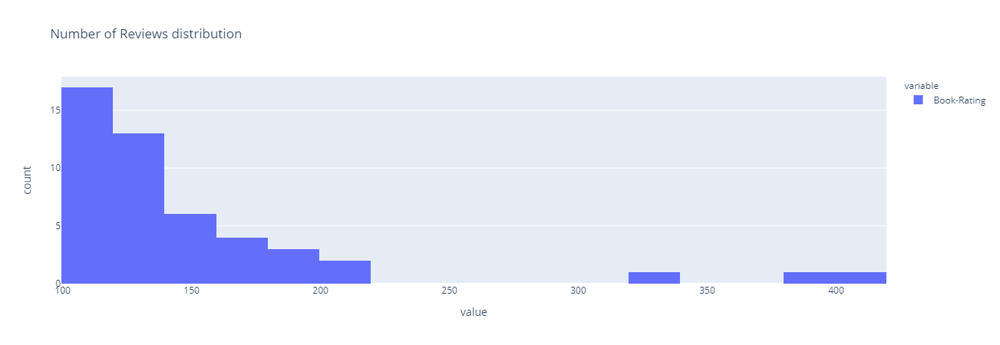

In [235]:
#plot a histogram
px.histogram(num_reviews[num_reviews['Book-Rating']>99]['Book-Rating'],
             title="Number of Reviews distribution",nbins=20)


There is a very small percentage of books with 100 oor greater number of reviews. Lets take a look at books with less than 100 number of reviews but greater than zero.

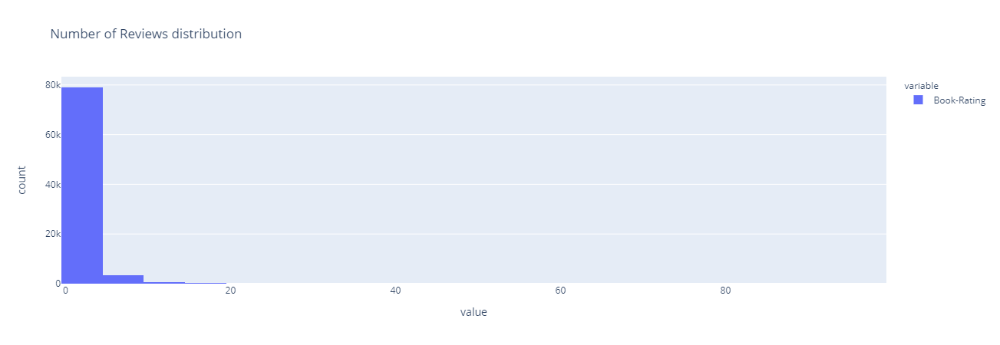

In [236]:
#plot histogram
px.histogram(num_reviews[(num_reviews['Book-Rating']<100) & num_reviews['Book-Rating']>0]['Book-Rating'],
             title="Number of Reviews distribution",nbins=20)

The majority of books have less than 100 reviews and between 1-4 reviews.

We can do “CI” calculations systematically for a large number of books at a fixed level of confidence: 95%. What this means is, that we can expect the “true” ratings for the books (after thousands of further ratings) to still lie within those earlier Confidence Intervals in 95% of cases. 

We can run a bootstrap method to see which number of ratings will work. We will run the maximum number of ratings in the bins in the ggraph up there to see how they will perform and how wide spread the confidence interval can be.

In [237]:
#create raanges for the max limits of the bins
for votes in range(4,40,5):
    indices = num_reviews[num_reviews['Book-Rating']==votes].index #extract indices of books
    ci_low = [] #create array for lower bounds of ci
    ci_up = [] #create array for upper bounds of ci
    
    #iterate through the books
    for index in indices:
        rats = user_rating_books[(user_rating_books['ISBN']==index) & 
                          (~user_rating_books['Book-Rating'].isna())]['Book-Rating'].values

        # Perform bootstrapping
        bootstrapped_means = []
        num_resamples = 1000
        for _ in range(num_resamples):
            resampled_data = np.random.choice(rats, size=len(rats), replace=True)
            bootstrapped_mean = np.mean(resampled_data)
            bootstrapped_means.append(bootstrapped_mean)

        # Calculate confidence interval
        ci_lower, ci_upper = np.percentile(bootstrapped_means, [2.5, 97.5])
        ci_low.append(ci_lower)
        ci_up.append(ci_upper)
    
    #calculate the means
    mean_ci_low = np.mean(ci_low)
    mean_ci_up = np.mean(ci_up)
    
    # Print the confidence interval
    print('--------------------------------------------------------------------------------------------')
    print("Number of Ratings: ", votes)
    print("Confidence Interval: {:.2f} to {:.2f}".format(mean_ci_low, mean_ci_up))
    print("Out of a rating of 10, the true rating can lie in the following % range: ", 
          (mean_ci_up-mean_ci_low)*100/10)
    print('--------------------------------------------------------------------------------------------')

--------------------------------------------------------------------------------------------

Number of Ratings:  4

Confidence Interval: 6.48 to 8.96

Out of a rating of 10, the true rating can lie in the following % range:  24.852596314907867

--------------------------------------------------------------------------------------------

--------------------------------------------------------------------------------------------

Number of Ratings:  9

Confidence Interval: 6.80 to 8.72

Out of a rating of 10, the true rating can lie in the following % range:  19.208891120035698

--------------------------------------------------------------------------------------------

--------------------------------------------------------------------------------------------

Number of Ratings:  14

Confidence Interval: 6.99 to 8.64

Out of a rating of 10, the true rating can lie in the following % range:  16.53676470588236

--------------------------------------------------------------------------

Having 19 or more ratings brings down the range of the ratings confidence interval within a narrow range of less than 15% difference. This shows us that a book having more than 19 votes in this dataset has a rating that can be reliaably used to make predictions. We will filter out to use books that have greater than 19 votes.

Also, the book ratings are seen to remain comparitively high as compared to the scale of 1-10. Lets see how many books do we truly have ratings less than 6.

In [238]:
#check value counts for less than 6 ratings
user_rating_books[user_rating_books['Book-Rating'] <6]['Book-Rating'].value_counts()

5.0    23887
4.0     4324
3.0     2876
2.0     1322
1.0      754
Name: Book-Rating, dtype: int64

In [239]:
#check total length
len(user_rating_books)

653360

We can see that books with ratings of 5 has aa good number but there arae very few books with ratings less than 5. Therefore. we can drop these records and only keep the ones greater than or equal to 5.

In [240]:
#filter for ratings greater thaaan 5 and the NaN values
user_rating_books = user_rating_books[(user_rating_books['Book-Rating'] >= 5) | 
                                      (user_rating_books['Book-Rating'].isna())]

After we are done filtering for aall other data points, we will filter out our dataset to keep only the books that have greater than 19 reviews.

In [241]:
#check info of the new dataset
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 644084 entries, 0 to 653359

Data columns (total 9 columns):

 #   Column               Non-Null Count   Dtype  

---  ------               --------------   -----  

 0   User-ID              644084 non-null  int64  

 1   ISBN                 644084 non-null  object 

 2   Book-Rating          222590 non-null  float64

 3   Book-Title           644084 non-null  object 

 4   Book-Author          644084 non-null  object 

 5   Year-Of-Publication  644084 non-null  int64  

 6   Publisher            644084 non-null  object 

 7   Age                  644084 non-null  float64

 8   Country              644084 non-null  object 

dtypes: float64(2), int64(2), object(5)

memory usage: 49.1+ MB


In [242]:
#check for duplicates
user_rating_books.duplicated().sum()

0

With all of this done, we can move onto Exploratory Data Analysis to understand more about the data we are working with. Moreover, we can use matrix factorization like Alternating Least Squares (ALS) to fill up missing values in a dataset for ratings through matrix completion. The idea is to factorize the user-item rating matrix using ALS and then use the learned factors to estimate the missing values. We can do this with the modelling part.

## EDA

In [243]:
#check info of the new dataset
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 644084 entries, 0 to 653359

Data columns (total 9 columns):

 #   Column               Non-Null Count   Dtype  

---  ------               --------------   -----  

 0   User-ID              644084 non-null  int64  

 1   ISBN                 644084 non-null  object 

 2   Book-Rating          222590 non-null  float64

 3   Book-Title           644084 non-null  object 

 4   Book-Author          644084 non-null  object 

 5   Year-Of-Publication  644084 non-null  int64  

 6   Publisher            644084 non-null  object 

 7   Age                  644084 non-null  float64

 8   Country              644084 non-null  object 

dtypes: float64(2), int64(2), object(5)

memory usage: 49.1+ MB


Lets start with looking at the Age data to see what the distribution of the Ages are.

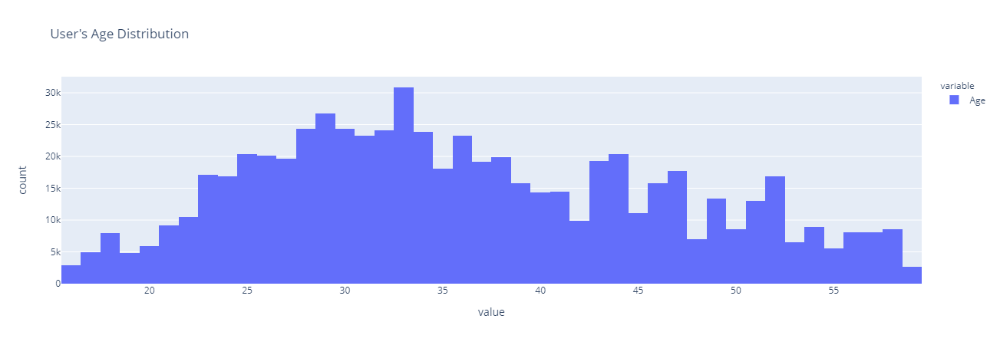

In [244]:
#plot Age against number of reviews
px.histogram(user_rating_books['Age'],title="User's Age Distribution")

The ages data is right skewed with a long tail. Most of the customers are in between 25 years old and 40 years old which is the ideal niche to focus on. These age groups are people who have money, are more inclined to use ecommercce and online services, and generally have the ability to read a lot more.

Lets check Top 10 countries that we have the data for.

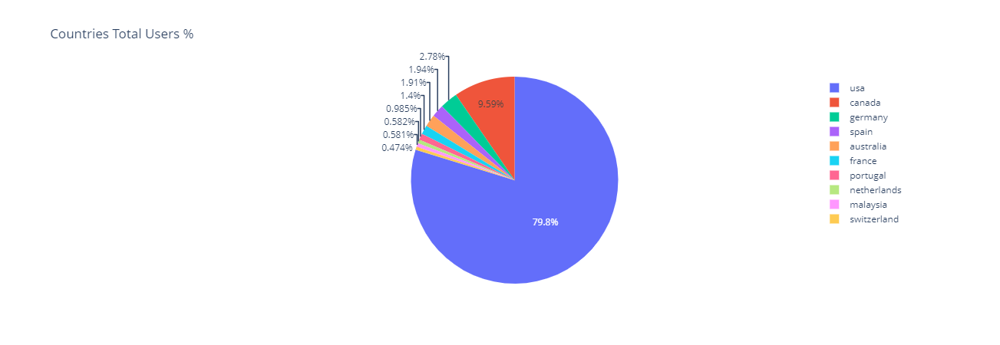

In [245]:
#group the data
country_data = user_rating_books.groupby("Country").size().sort_values(ascending= False).head(10)

#separate index and values for names
names = country_data.index
values = country_data.values

#plot pie chart
px.pie(values = values, names = names,title = "Countries Total Users %")

In [246]:
#check Country value percentages
user_rating_books["Country"].value_counts(normalize=True)

usa          0.780740
canada       0.093825
germany      0.027236
spain        0.018945
australia    0.018676
               ...   
angola       0.000002
ethiopia     0.000002
algeria      0.000002
zambia       0.000002
uganda       0.000002
Name: Country, Length: 103, dtype: float64

Looks like almost 84% of the data is from US customers. This is a highly biased dataset leaning towards USA. Rather than trying to train the model for other countries, it would be more useful to have more reliable recommendation system for a single country and find more data for the other countries before making aaa recommendation system for their users.

In [247]:
#set the countries to filter for
countries = ['usa']

#filter for the countries to keep
user_rating_books = user_rating_books[user_rating_books['Country'].isin(countries)]

#preview the dataset
user_rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Age,Country
1,638,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books,20.0,usa
2,638,0316666343,10.0,The Lovely Bones: A Novel,Alice Sebold,2002,"Little, Brown",20.0,usa
3,638,0375400699,10.0,Love in the Time of Cholera (Everyman's Librar...,GABRIEL GARCIA MARQUEZ,1997,Everyman's Library,20.0,usa
4,638,0385504209,10.0,The Da Vinci Code,Dan Brown,2003,Doubleday,20.0,usa
5,638,0679746048,7.0,"Girl, Interrupted",SUSANNA KAYSEN,1994,Vintage,20.0,usa


In [248]:
#check country values
user_rating_books['Country'].value_counts()

usa    502862
Name: Country, dtype: int64

In [249]:
#check info
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 502862 entries, 1 to 653358

Data columns (total 9 columns):

 #   Column               Non-Null Count   Dtype  

---  ------               --------------   -----  

 0   User-ID              502862 non-null  int64  

 1   ISBN                 502862 non-null  object 

 2   Book-Rating          164882 non-null  float64

 3   Book-Title           502862 non-null  object 

 4   Book-Author          502862 non-null  object 

 5   Year-Of-Publication  502862 non-null  int64  

 6   Publisher            502862 non-null  object 

 7   Age                  502862 non-null  float64

 8   Country              502862 non-null  object 

dtypes: float64(2), int64(2), object(5)

memory usage: 38.4+ MB


Lets look at the book ratings to understand their distribution better.

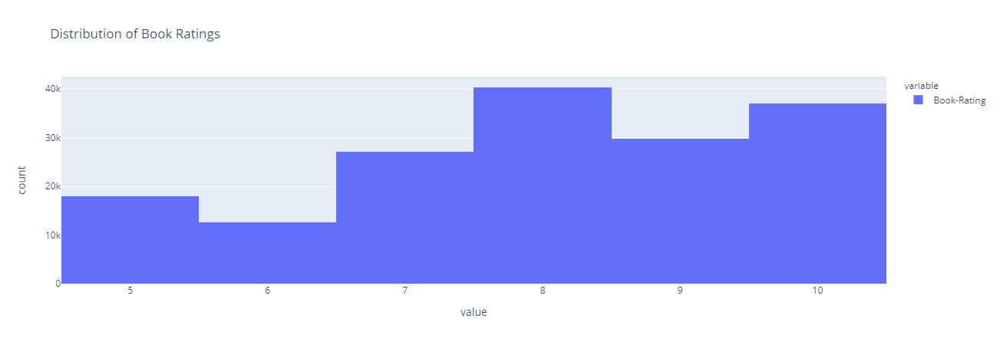

In [250]:
#plot book ratings
px.histogram(user_rating_books['Book-Rating'],title="Distribution of Book Ratings")

The ratings are left skewed with most of them lying between 7 and 10. This shows that most people have rated books on a higher scale with 8 with the most popular one.

Next we will check the average ratings of title.

In [251]:
#group by title and find the avergaae book ratings
avg_rating_book = user_rating_books.groupby("ISBN").mean()["Book-Rating"].sort_values(ascending=False)

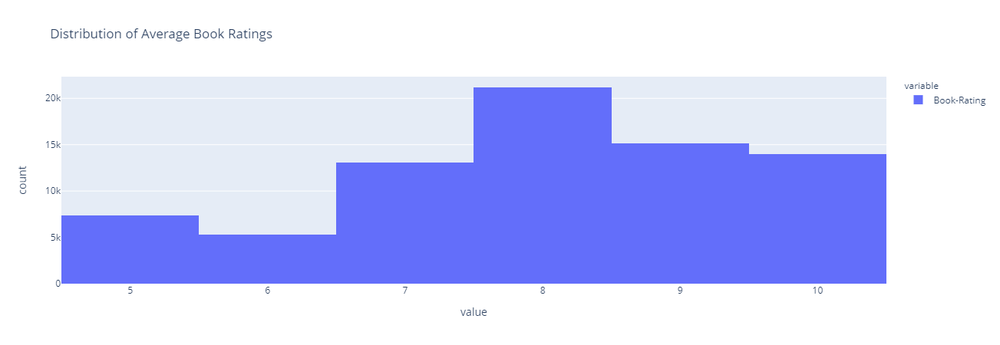

In [252]:
#plot average book ratings
px.histogram(avg_rating_book,title="Distribution of Average Book Ratings", nbins=7)

In [253]:
avg_rating_book.mean()

7.925450320566293

The average book ratings are almost normally distributed which shows that even though people generally were seen giving higher ratings, on an average, for every title, it has balanced out.

In [254]:
#check info
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 502862 entries, 1 to 653358

Data columns (total 9 columns):

 #   Column               Non-Null Count   Dtype  

---  ------               --------------   -----  

 0   User-ID              502862 non-null  int64  

 1   ISBN                 502862 non-null  object 

 2   Book-Rating          164882 non-null  float64

 3   Book-Title           502862 non-null  object 

 4   Book-Author          502862 non-null  object 

 5   Year-Of-Publication  502862 non-null  int64  

 6   Publisher            502862 non-null  object 

 7   Age                  502862 non-null  float64

 8   Country              502862 non-null  object 

dtypes: float64(2), int64(2), object(5)

memory usage: 38.4+ MB


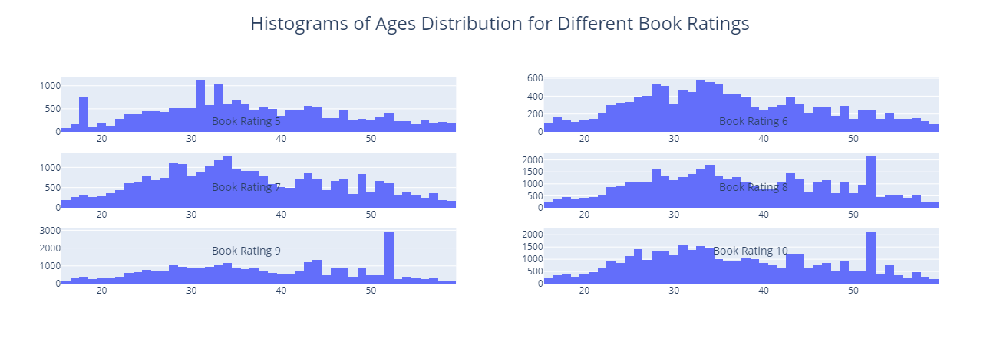

In [255]:
import plotly.subplots as sp

# Create subplots
fig = sp.make_subplots(rows=3, cols=2)

# Add histograms to subplots
fig.add_trace(px.histogram(user_rating_books[user_rating_books['Book-Rating'] == 5]['Age']).data[0], row=1, col=1)
fig.add_trace(px.histogram(user_rating_books[user_rating_books['Book-Rating'] == 6]['Age']).data[0], row=1, col=2)
fig.add_trace(px.histogram(user_rating_books[user_rating_books['Book-Rating'] == 7]['Age']).data[0], row=2, col=1)
fig.add_trace(px.histogram(user_rating_books[user_rating_books['Book-Rating'] == 8]['Age']).data[0], row=2, col=2)
fig.add_trace(px.histogram(user_rating_books[user_rating_books['Book-Rating'] == 9]['Age']).data[0], row=3, col=1)
fig.add_trace(px.histogram(user_rating_books[user_rating_books['Book-Rating'] == 10]['Age']).data[0], row=3, col=2)

# Update layout with chart titles
fig.update_layout(
    showlegend=False,
    title_text="Histograms of Ages Distribution for Different Book Ratings",
    title_font_size=24,
    title_x=0.5,
    title_y=0.95,
    # Set individual subplot titles
    annotations=[
        dict(
            text="Book Rating 5",
            x=0.17,
            y=0.83,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 6",
            x=0.83,
            y=0.83,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 7",
            x=0.17,
            y=0.47,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 8",
            x=0.83,
            y=0.47,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 9",
            x=0.17,
            y=0.12,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 10",
            x=0.83,
            y=0.12,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        )
    ]
)

# Update layout
fig.update_layout(showlegend=False)

# Show the figure
fig.show()

For every rating we have a similaar distribution of age groups we have records for. As we saw earlieer, most of our data is coming from 25-40 year olds which is the main niche that we can rely on as the customer base.


Nonetheless, lets explore how do the different age groups rate. There is a possibility that some aage groups are stricter raters than other or vice versa. Lets explore this.

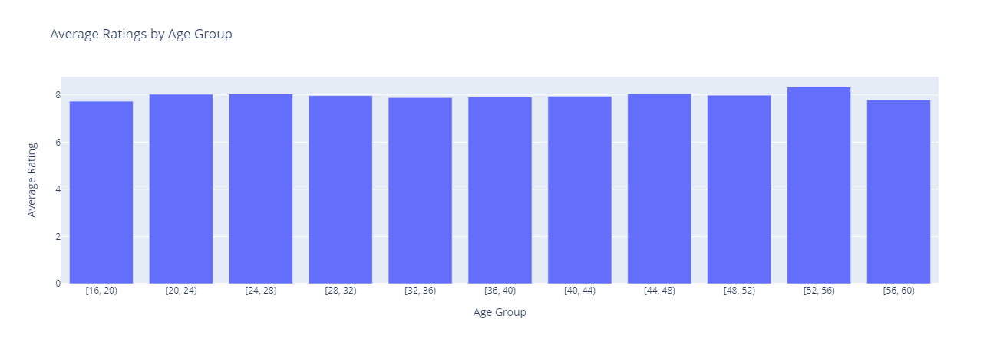

In [256]:
# Asigned temp data 
data = user_rating_books

# Create age categories using a temporary column
data['Age_Category'] = pd.cut(data['Age'], bins=range(16, 61, 4), right=False).astype(str)

# Calculate average ratings for each age category
avg_ratings = data.groupby('Age_Category')['Book-Rating'].mean().reset_index()

# Create the plot using Plotly Express
fig = px.bar(avg_ratings, x='Age_Category', y='Book-Rating', labels={'Age_Category': 'Age Group', 'Rating': 'Average Rating'}, title = "Average Rating VS Age Group for ")

# Customize the plot layout
fig.update_layout(title='Average Ratings by Age Group', xaxis_title='Age Group', yaxis_title='Average Rating')

# Show the plot
fig.show()

All of the age groups rate very close to each other, remaining mostly close to 8. This is a good sign that there are no drastic skewness with any age groups.

Lets check to see how do different age groups differ in their choice of books relative to when they were published.

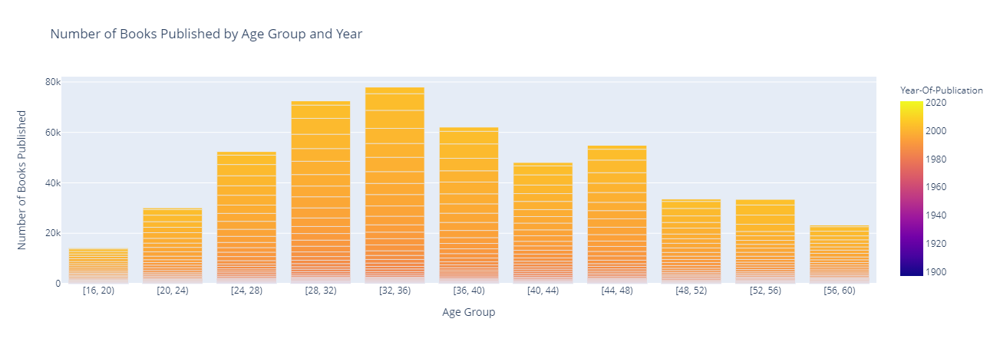

In [257]:
import plotly.express as px

# Assigned temp data
data = user_rating_books

# Group the data by age groups and count the number of books published in a certain year
grouped_data = data.groupby(['Age_Category', 'Year-Of-Publication']).size().reset_index(name='Number of Books')

# Create a bar chart
fig = px.bar(grouped_data, x='Age_Category', y='Number of Books', color='Year-Of-Publication',
             title='Number of Books Published by Age Group and Year')

# Set axes labels
fig.update_layout(
    xaxis_title='Age Group',
    yaxis_title='Number of Books Published'
)

# Show the figure
fig.show()

We don't have anomalies with any age groups associations to years of publications.

Next lets check what the average age of readers is for the top 20 highest rated authors.

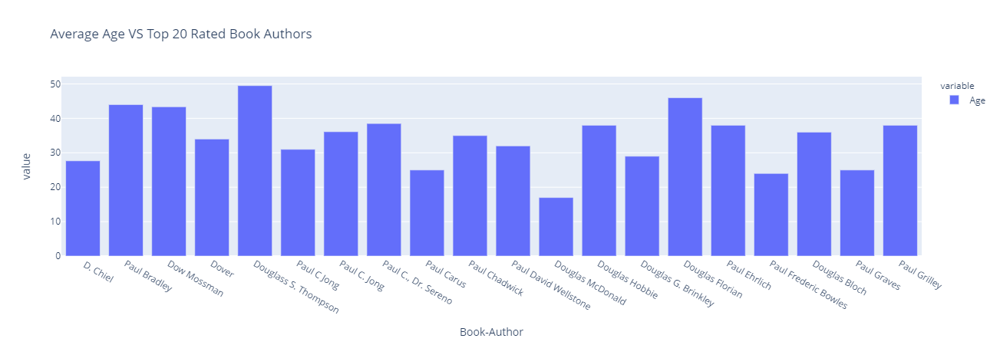

In [258]:
#filter for top 20
data = user_rating_books.groupby(['Book-Author']).mean().sort_values(['Book-Rating'],ascending=False).head(20)

#plot
px.bar(data['Age'], title = "Average Age VS Top 20 Rated Book Authors")

Mostly the ages are between 30-40. This is making the customer persona clearer. The  biggest customer base will be between 25-40 year old.

Now lets check which authors have written the most books. We can check if there is some trend to the number of books written and higher ratings.

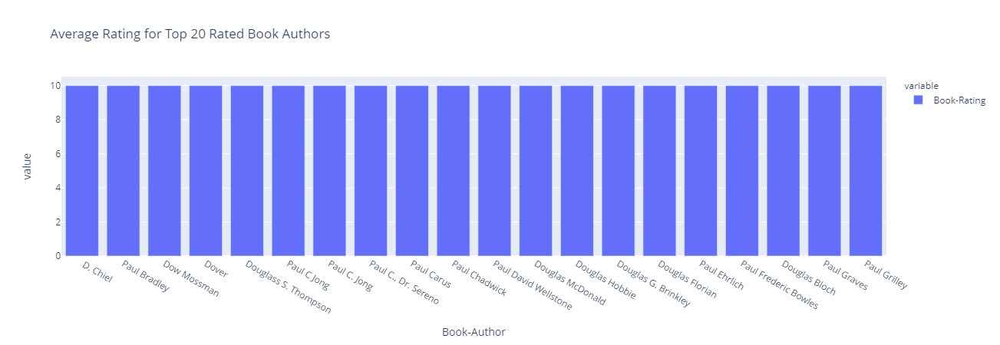

In [259]:
#filter for top 20
data = user_rating_books.groupby(['Book-Author']).mean().sort_values(['Book-Rating'],ascending=False).head(20)

#plot
px.bar(data['Book-Rating'], title = "Average Rating for Top 20 Rated Book Authors")

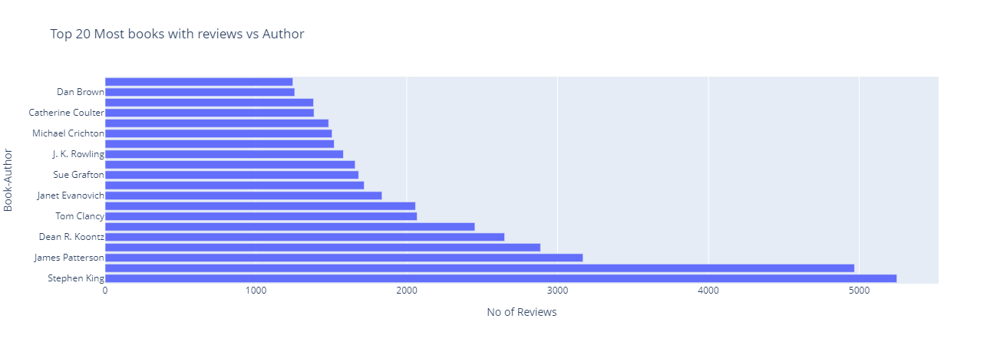

In [261]:
#groupby aand filter for authors
Author = user_rating_books.groupby("Book-Author").size().sort_values(ascending = False).head(20)
Author = pd.DataFrame({"Book-Author":Author.index,"No of Reviews":Author.values})

#plot
px.bar(data_frame = Author, y="Book-Author", x="No of Reviews" , title = "Top 20 Most books with reviews vs Author")

We do see that if there are more reviews for a book, they have a lower average rating which showcases that higher number of reviews improves the confidence in an author's rating and stabilises it. Nonetheless, we do see some of the higher rated authors in the above list also.

Next, lets investigate publishers in the same way.

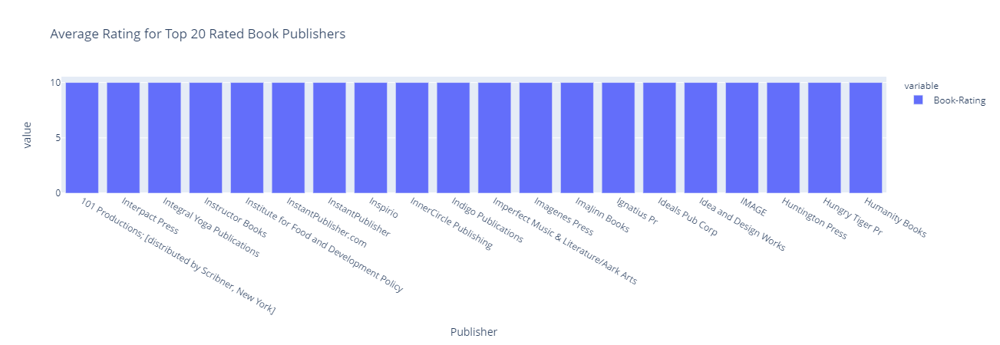

In [262]:
#groupby and filter for top 20
publisher = user_rating_books.groupby("Publisher").mean().sort_values(['Book-Rating'],ascending=False).head(20)

#plot
px.bar(publisher['Book-Rating'], title = "Average Rating for Top 20 Rated Book Publishers")

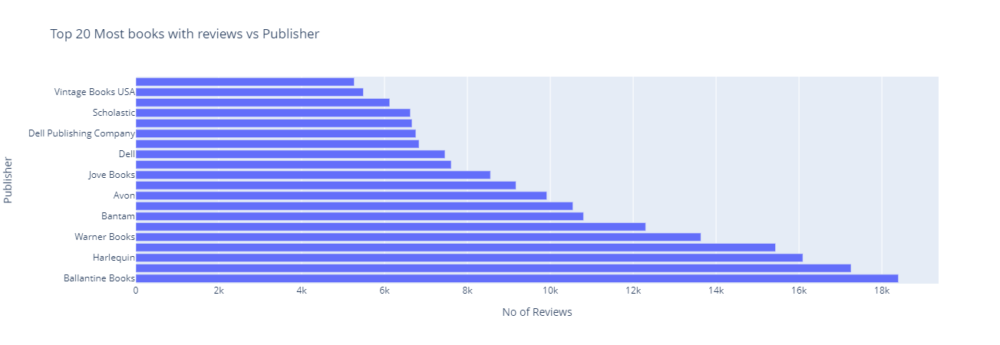

In [264]:
#groupby and filter for top 20
publisher = user_rating_books.groupby("Publisher").size().sort_values(ascending = False).head(20)
publisher = pd.DataFrame({"Publisher":publisher.index,"No of Reviews":publisher.values})

#plot
px.bar(data_frame = publisher, y="Publisher", x="No of Reviews" , title = "Top 20 Most books with reviews vs Publisher")

Similar to authors, most of the publishers who have the most reviews for their books do not have the best average ratings. This further solidifies the understanding that higher number of reviews tends to stabilize the rating of a Publisher within a range that can be confidently interpreted.

Now we will go ahead and filter out the books that have less than 19 reviews.

In [265]:
#groupby ISBN and calculate numebr of reviews
num_reviews = user_rating_books.groupby('ISBN').count()

#extract indices of books
indices = num_reviews[num_reviews['Book-Rating']>19].index 

#filter to keep the books with the correct indices
user_rating_books = user_rating_books[(user_rating_books['ISBN'].isin(indices))]

#preview
user_rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Age,Country,Age_Category
1,638,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books,20.0,usa,"[20, 24)"
2,638,0316666343,10.0,The Lovely Bones: A Novel,Alice Sebold,2002,"Little, Brown",20.0,usa,"[20, 24)"
4,638,0385504209,10.0,The Da Vinci Code,Dan Brown,2003,Doubleday,20.0,usa,"[20, 24)"
5,638,0679746048,7.0,"Girl, Interrupted",SUSANNA KAYSEN,1994,Vintage,20.0,usa,"[20, 24)"
7,638,0670892963,7.0,Bridget Jones : The Edge of Reason,Helen Fielding,2000,Viking Books,20.0,usa,"[20, 24)"


We will filter out the missing values into te recommendation set that we will use to predict book ratings and recommend the books that useers haven't read.

In [266]:
#filter for the datasets with missing ratings
rec_set = user_rating_books[user_rating_books['Book-Rating'].isna()]

#preview data
rec_set.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Age,Country,Age_Category
1,638,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books,20.0,usa,"[20, 24)"
12,638,0743206045,NaN,Daddy's Little Girl,Mary Higgins Clark,2002,Simon &amp; Schuster,20.0,usa,"[20, 24)"
69,638,080411868X,NaN,"Welcome to the World, Baby Girl!",Fannie Flagg,1999,Ballantine Books,20.0,usa,"[20, 24)"
74,3363,0446520802,NaN,The Notebook,Nicholas Sparks,1996,Warner Books,29.0,usa,"[28, 32)"
75,3363,002542730X,NaN,Politically Correct Bedtime Stories: Modern Ta...,James Finn Garner,1994,John Wiley &amp; Sons Inc,29.0,usa,"[28, 32)"


In [267]:
#check info
rec_set.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 40644 entries, 1 to 636960

Data columns (total 10 columns):

 #   Column               Non-Null Count  Dtype  

---  ------               --------------  -----  

 0   User-ID              40644 non-null  int64  

 1   ISBN                 40644 non-null  object 

 2   Book-Rating          0 non-null      float64

 3   Book-Title           40644 non-null  object 

 4   Book-Author          40644 non-null  object 

 5   Year-Of-Publication  40644 non-null  int64  

 6   Publisher            40644 non-null  object 

 7   Age                  40644 non-null  float64

 8   Country              40644 non-null  object 

 9   Age_Category         40644 non-null  object 

dtypes: float64(2), int64(2), object(6)

memory usage: 3.4+ MB


In [268]:
#drop records with missing ratings
user_rating_books = user_rating_books[~user_rating_books['Book-Rating'].isna()]

#preview dataset
user_rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Age,Country,Age_Category
2,638,0316666343,10.0,The Lovely Bones: A Novel,Alice Sebold,2002,"Little, Brown",20.0,usa,"[20, 24)"
4,638,0385504209,10.0,The Da Vinci Code,Dan Brown,2003,Doubleday,20.0,usa,"[20, 24)"
5,638,0679746048,7.0,"Girl, Interrupted",SUSANNA KAYSEN,1994,Vintage,20.0,usa,"[20, 24)"
7,638,0670892963,7.0,Bridget Jones : The Edge of Reason,Helen Fielding,2000,Viking Books,20.0,usa,"[20, 24)"
8,638,0316776963,10.0,Me Talk Pretty One Day,David Sedaris,2001,Back Bay Books,20.0,usa,"[20, 24)"


In [269]:
#check info
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 27476 entries, 2 to 636959

Data columns (total 10 columns):

 #   Column               Non-Null Count  Dtype  

---  ------               --------------  -----  

 0   User-ID              27476 non-null  int64  

 1   ISBN                 27476 non-null  object 

 2   Book-Rating          27476 non-null  float64

 3   Book-Title           27476 non-null  object 

 4   Book-Author          27476 non-null  object 

 5   Year-Of-Publication  27476 non-null  int64  

 6   Publisher            27476 non-null  object 

 7   Age                  27476 non-null  float64

 8   Country              27476 non-null  object 

 9   Age_Category         27476 non-null  object 

dtypes: float64(2), int64(2), object(6)

memory usage: 2.3+ MB


A big chunk of our data has missing ratings as compared to the available values for us. This iis not ideal sicne we would ideally want more data to train our model on. Nonetheless, we will see how our models perform with the available data

In [270]:
# #make a temporary copy
# temp_data = user_rating_books.copy()

# #drop rowss with missing values
# temp_data.dropna(inplace=True)

# #groupby ISSBN and find mean
# temp_data = temp_data.groupby("ISBN").mean()

# #round the data
# temp_data['Book-Rating'] = temp_data['Book-Rating'].round()

# #preview the data
# temp_data['Book-Rating']

In [271]:
# for index in temp_data.index:
#     value = temp_data['Book-Rating'].loc[index] 

#     user_rating_books['Book-Rating'] = user_rating_books.groupby('ISBN')['Book-Rating'].fillna(value)

### Data Limitations

Before we get into Modelling, there are a few limitiations of the Data that we should be aware of.

    1. There is very few demogrphic information for the users available to develop a solid user persona to base recommendations on.
    
    2. There is no information available for book genres that can be used for devveloping more informaative vectors about books.
    
    3. The data is only focused for the US population. If the customer base needs to be expaanded to other ountries, than more data from the other countries will have to be gathered.
    
    4. The missing rating records are almost double in number as compared to the records with non-missing ratings. This is not ideal sice we would like to have a dataset which is larger than the missing values dataset . Wiith more missing values, there will definiteely be areas or aspects that our model isn't trained to handle.
    
    5. The general bias of marketing and promotion is not considered in this dataset. Through Social Sciences, it is known
    
    6. There are very few low ratings available while most ratings arae on the higher side.
    
    7. Only ratings on a scale of 1-10 are available. There are no reviews available that would also provide a qulittaive analysis of what specifically did the user like.

## Model Preprocessing

In [272]:
#import relevant libraries
from surprise import Dataset, Reader

from surprise.model_selection import train_test_split
from sklearn import model_selection 

from imblearn.under_sampling import RandomUnderSampler

from sklearn.model_selection import train_test_split,RandomizedSearchCV,GridSearchCV
from tqdm import tqdm

Lets start off with separating the data. We will use the ISBN to identify our books. We can later use the predicted ISBN to extract the Book title name. Since the ISBN is the unique identifier, thata will be the best feature to use.

In [273]:
#separate the columns to use
ml_ratings = user_rating_books[['User-ID',
                                'ISBN',
                                'Book-Author',
                                'Year-Of-Publication',
                                'Publisher',
                                'Age',
                                'Country',
                                'Age_Category',
                                'Book-Rating']]

#check for duplicates
ml_ratings.duplicated().sum()

0

In [274]:
#check info
ml_ratings.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 27476 entries, 2 to 636959

Data columns (total 9 columns):

 #   Column               Non-Null Count  Dtype  

---  ------               --------------  -----  

 0   User-ID              27476 non-null  int64  

 1   ISBN                 27476 non-null  object 

 2   Book-Author          27476 non-null  object 

 3   Year-Of-Publication  27476 non-null  int64  

 4   Publisher            27476 non-null  object 

 5   Age                  27476 non-null  float64

 6   Country              27476 non-null  object 

 7   Age_Category         27476 non-null  object 

 8   Book-Rating          27476 non-null  float64

dtypes: float64(2), int64(2), object(5)

memory usage: 2.1+ MB


Recall that the missing values in Book-Rating need to bee handled through matrix factorization. Lets see again what the distribution of the ratings looks like currently.

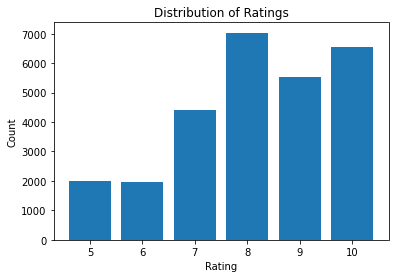

In [275]:
import matplotlib.pyplot as plt

# Count the occurrences of each rating value
rating_counts = ml_ratings['Book-Rating'].value_counts()

# Plot the distribution of ratings
plt.bar(rating_counts.index, rating_counts.values)
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Distribution of Ratings')
plt.show()

Next, we will split our dataset into three sets; Train set, Validation Set, Test Set. The traain set will be used to traain the models and the validation set will be cossequently used to test these models. After the best performing model haas been selected, we will use the test set to run the metrics and do a final evaluation.

In [276]:
# Import the necessary libraries
from surprise import Reader, Dataset
from sklearn.model_selection import train_test_split

#split into train/valid sets and test sets
train_valid_set, test = model_selection.train_test_split(ml_ratings, 
                                                             test_size=0.2, 
                                                             random_state = 23)

# Create a Reader object with the rating scale
reader = Reader(rating_scale=(5, 10))

# Load the data from the train_valid_set DataFrame into a Surprise Dataset
data = Dataset.load_from_df(train_valid_set[['User-ID', 'ISBN', 'Book-Rating']], reader)

# Convert Surprise Dataset to a pandas DataFrame
df = pd.DataFrame(data.raw_ratings, columns=['User-ID', 'ISBN', 'Book-Rating', 'timestamp'])

# Split the data into train_valid and test sets
train_df, valid_df = train_test_split(df, test_size=0.25, random_state=42)

# Convert the train, valid and test DataFrames back to Surprise Dataset
trainset = Dataset.load_from_df(train_df[['User-ID', 'ISBN', 'Book-Rating']], reader)
validset = Dataset.load_from_df(valid_df[['User-ID', 'ISBN', 'Book-Rating']], reader)
testset = Dataset.load_from_df(test[['User-ID', 'ISBN', 'Book-Rating']], reader)

#Build the Trainset object
train_set = trainset.build_full_trainset()

# Build the validset object
valid_set = validset.build_full_trainset().build_testset()

# Build the Testset object
test_set = testset.build_full_trainset().build_testset()

In [277]:
#preview train set
train_set

With traain, validation and test sets available, lets move on to modelling our data.

## Modelling and Evaluation

In [278]:
#import libraries
from surprise import SVD , NMF , KNNBasic, KNNWithMeans, KNNWithZScore, KNNBaseline
from surprise.model_selection import RandomizedSearchCV
from surprise import accuracy

We will be using the following methods for modelling:
    
    1. KNN
    
    2. SVD
    
    3. NMF

**KNNWithMeans, KNNWithZScore, and KNNBaseline** are collaborative filtering algorithms based on the K-Nearest Neighbors approach. They leverage the similarities between users or items to make predictions. KNNWithMeans considers the mean ratings, KNNWithZScore incorporates normalization of ratings, and KNNBaseline integrates a baseline rating estimation. These algorithms are effective when the data exhibits localized similarities and can provide accurate recommendations based on nearest neighbors.

**SVD (Singular Value Decomposition)** is a popular matrix factorization technique widely used in recommendation systems. It can effectively capture latent factors in the data by decomposing the user-item rating matrix into lower-dimensional matrices. SVD performs well in reducing noise and capturing underlying patterns, making it a reliable choice for recommendation modeling.

**NMF (Non-Negative Matrix Factorization)** is another matrix factorization method that imposes non-negativity constraints on the factor matrices. It is particularly useful when dealing with non-negative data, such as ratings or counts. NMF can provide meaningful latent factors and help in generating accurate recommendations.

To handle missing values in the book ratings, the **ALS (Alternating Least Squares) algorithm can be utilized in conjunction with KNN modeling**. ALS is a matrix factorization method that iteratively fills in the missing values by estimating latent factors. It can be applied before the train-test split, ensuring that the imputation process is based solely on the training data.

Alternatively, **SVD and NMF can handle missing values on their own**. These matrix factorization methods inherently impute missing values as part of the factorization process. By considering the available ratings and latent factors, they can estimate missing values and generate recommendations accordingly.

The evaluation metrics that we will use to evluate the performance of these models are listed below with theeir pros and cons.

**FCP (Fraction of Concordant Pairs)** is a commonly used evaluation metric for collaborative filtering algorithms. It measures the fraction of pairs of items or users where the predicted ordering of preferences is consistent with the observed ordering. FCP is advantageous because it is less sensitive to overall rating values and focuses more on the relative rankings. However, a limitation of FCP is that it does not consider the magnitude of the predicted ratings.

**RMSE (Root Mean Squared Error)** is a popular evaluation metric that calculates the square root of the average of squared differences between predicted and actual ratings. RMSE penalizes larger prediction errors more heavily and provides a good overall measure of accuracy. However, RMSE is sensitive to outliers and can be influenced by extreme ratings, which might not be desirable in certain cases.

**MSE (Mean Squared Error)** is similar to RMSE, but it does not take the square root. Instead, it calculates the average of squared differences between predicted and actual ratings. MSE is useful for comparing models and identifying the best-performing one. However, like RMSE, it is sensitive to outliers and may not provide an intuitive understanding of the prediction errors in terms of the original rating scale.

**MAE (Mean Absolute Error)** is an evaluation metric that calculates the average of absolute differences between predicted and actual ratings. MAE provides a more interpretable measure of prediction errors in terms of the original rating scale. It is less sensitive to outliers compared to RMSE and MSE. However, MAE treats all prediction errors equally, which means it does not differentiate between small and large errors.

In summary, FCP is a suitable metric for collaborative filtering algorithms as it focuses on relative rankings. RMSE and MSE provide overall accuracy measures but are sensitive to outliers. MAE is more interpretable and less sensitive to outliers, but it treats all errors equally. The choice of evaluation metric depends on the specific requirements and priorities of the recommendation system.

In [279]:
final_models = {
    "Name":[],
    "Model":[],
    "FCP":[],
    "RMSE":[],
    "MSE":[],
    "MAE":[],
}

### Baseline Model

We will start with a baseline model. We will KNN Basic for the baselinne model. We won't be doing aany paraameter optimizations. It can handle both numerical and categorical features, accommodating a diverse range of book characteristics. The algorithm does not assume a specific data distribution, allowing it to adapt to changing user tastes over time without retraining. However, KNN may struggle with high-dimensional data and can be computationally expensive for large datasets. While it serves as a solid starting point, more advanced algorithms can be employed to improve accuracy and scalability.

In [280]:
algo = KNNBasic()

# Train the model on the training set
algo.fit(train_set)

# Evaluate the model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)

final_models["Name"].append("KNNBasic")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Computing the msd similarity matrix...

Done computing similarity matrix.

RMSE: 1.6180

MAE:  1.2702

MSE: 2.6179

FCP:  0.5885


**RMSE (Root Mean Square Error):**
RMSE measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. In this case, the RMSE value of 1.6180 indicates that, on average, the model's predictions for book ratings deviate from the actual ratings by approximately 1.6180 on the 5-10 scale. Lower RMSE values indicate better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
MAE also measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. The MAE value of 1.2702 suggests that, on average, the model's predictions deviate from the true ratings by approximately 1.2702 on the 5-10 scale. Similarly to RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
MSE is another measure of the prediction accuracy, but it focuses on the squared differences between the model's predicted ratings and the actual ratings. The MSE value of 2.6179 represents the average of these squared differences. Like RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
FCP is a different type of evaluation metric often used in recommendation systems. It measures the proportion of pairs of items where the model correctly predicts the relative order of ratings. In this case, the FCP value of 0.5885 suggests that approximately 58.85% of the pairs are correctly ranked by the model. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Overall, based on these evaluation metrics, it seems that the book recommendation model is performing reasonably well. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 1.5 to 2 units on the 5-10 scale. The FCP value of 0.5885 suggests that the model is able to correctly rank the relative order of book ratings in approximately 58.85% of cases.

We will try other KNN models to see if we can improve the performance.

### KNN Baseline

The KNN Baseline model is a preferable choice over the KNN Basic model due to its ability to enhance performance in several ways. Unlike the KNN Basic model, which relies solely on the similarity between instances to make predictions, the KNN Baseline model incorporates additional information by considering the baselines of users and items. By estimating the overall rating tendencies of users and items, the KNN Baseline model effectively reduces the impact of outliers and accounts for the inherent biases present in the dataset. This incorporation of baseline estimates allows for a more accurate and robust prediction process, leading to improved performance in recommendation systems. Consequently, the KNN Baseline model is considered a valuable upgrade to the KNN Basic model as it leverages additional information to deliver enhanced predictions and better overall performance.

We will also optimize the model's parameters to fine tune performance.

The **'k' parameter** determines the number of neighbors considered when making predictions, and trying different values such as 10, 20, 30, and 40 allows us to find the optimal value that balances accuracy and computational efficiency.

The **'sim_options' parameter** specifies the similarity metric to be used, with options like 'msd' (mean squared difference), 'cosine', and 'pearson'. By testing these different metrics, we can identify the one that best captures the relationships between users and items in the dataset.

The **'min_support' parameter** determines the minimum number of common items required for two users to be considered neighbors. Evaluating this parameter with values like 3 and 5 helps us understand the impact of item overlap on the quality of recommendations.

The **'user_based' parameter** being set to 'True' indicates that the model uses a user-based collaborative filtering approach, where recommendations are based on similarities between users. This setting can be compared with item-based collaborative filtering to determine which approach yields better results.

Finally, setting **"verbose"** to 'False' ensures that the model does not produce excessive output during training and evaluation, keeping the process more streamlined.

By searching for the optimal combination of these parameters, we can fine-tune the KNN Baseline model to achieve improved performance and generate more accurate recommendations.

In [281]:
# Define the parameter grid for hyperparameter tuning
param_grid = { 
    'k': [10, 20, 30, 40],
    'sim_options' : {
        'name'       : ['msd','cosine','pearson'],
        'min_support': [3,5],
        'user_based' : [True]
        },
    "verbose" : [False]
    }

# Perform grid search with cross-validation
grid = RandomizedSearchCV(KNNBaseline, param_distributions=param_grid, measures=['rmse'], cv=5)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE score and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("KNNBaseline")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 1.3921301712734047

Best parameters: {'k': 10, 'sim_options': {'name': 'pearson', 'min_support': 5, 'user_based': True}, 'verbose': False}

RMSE: 1.4017

MAE:  1.1309

MSE: 1.9648

FCP:  0.5516


**RMSE (Root Mean Square Error):**
RMSE measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. In this case, the RMSE value of 1.4017 indicates that, on average, the model's predictions for book ratings deviate from the actual ratings by approximately 1.4017 on the 5-10 scale. Lower RMSE values indicate better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
MAE also measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. The MAE value of 1.1309 suggests that, on average, the model's predictions deviate from the true ratings by approximately 1.1309 on the 5-10 scale. Similarly to RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
MSE is another measure of the prediction accuracy, but it focuses on the squared differences between the model's predicted ratings and the actual ratings. The MSE value of 1.9648 represents the average of these squared differences. Like RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
FCP is a different type of evaluation metric often used in recommendation systems. It measures the proportion of pairs of items where the model correctly predicts the relative order of ratings. In this case, the FCP value of 0.5516 suggests that approximately 55.16% of the pairs are correctly ranked by the model. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, it appears that the book recommendation model is performing fairly well. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 1.4 to 2 units on the 5-10 scale. The FCP value of 0.5516 suggests that the model is able to correctly rank the relative order of book ratings in approximately 55.16% of cases.

### KNN with Means

In [282]:
# Define the parameter grid for hyperparameter tuning
param_grid = { 
    'k': [10, 20, 30, 40],
    'sim_options' : {
        'name'       : ['msd','cosine','pearson'],
        'min_support': [3,5],
        'user_based' : [True]
        },
    "verbose" : [False]
    }

# Perform grid search with cross-validation
grid = RandomizedSearchCV(KNNWithMeans, param_distributions=param_grid, measures=['rmse'], cv=5)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE score and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("KNNWithMeans")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 1.490419118989766

Best parameters: {'k': 20, 'sim_options': {'name': 'msd', 'min_support': 5, 'user_based': True}, 'verbose': False}

RMSE: 1.5075

MAE:  1.1637

MSE: 2.2725

FCP:  0.7116


**RMSE (Root Mean Square Error):**
RMSE measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. In this case, the RMSE value of 1.5040 indicates that, on average, the model's predictions for book ratings deviate from the actual ratings by approximately 1.5040 on the 5-10 scale. Lower RMSE values indicate better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
MAE also measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. The MAE value of 1.1604 suggests that, on average, the model's predictions deviate from the true ratings by approximately 1.1604 on the 5-10 scale. Similarly to RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
MSE is another measure of the prediction accuracy, but it focuses on the squared differences between the model's predicted ratings and the actual ratings. The MSE value of 2.2619 represents the average of these squared differences. Like RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
FCP is a different type of evaluation metric often used in recommendation systems. It measures the proportion of pairs of items where the model correctly predicts the relative order of ratings. In this case, the FCP value of 0.7114 suggests that approximately 71.14% of the pairs are correctly ranked by the model. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, it appears that the book recommendation model is performing reasonably well. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 1.4 to 2.3 units on the 5-10 scale. The FCP value of 0.7114 suggests that the model is able to correctly rank the relative order of book ratings in approximately 71.14% of cases.

We can try and see if we can improve performance throough KNN with Z Score.

### KNN with Z Score

KNN with Z score is a superior model compared to KNN Baseline as it brings additional advantages to enhance performance. While KNN Baseline incorporates baseline estimates to mitigate biases and outliers, KNN with Z score further improves the model by standardizing the ratings across the dataset. By transforming the ratings into z-scores, which represent the number of standard deviations an individual rating is from the mean, KNN with Z score eliminates the influence of varying rating scales and normalizes the data. This normalization enables better comparison and similarity calculations between instances, resulting in more accurate predictions. Moreover, by taking into account the entire rating distribution rather than just the mean and biases, KNN with Z score offers a more comprehensive and nuanced understanding of the data, leading to improved performance in recommendation systems. Therefore, KNN with Z score is a favorable choice over KNN Baseline, as it leverages standardized ratings to enhance accuracy, comparability, and the overall performance of the model.

The parameters optimized are listed below.

The **'k' parameter** determines the number of neighbors considered when making predictions, and trying values like 10, 20, 30, and 40 allows us to find the optimal balance between accuracy and computational efficiency.

The **'sim_options' parameter** specifies the similarity metric to be used, with options such as 'msd' (mean squared difference), 'cosine', and 'pearson'. By testing these different similarity metrics, we can identify the one that best captures the relationships between instances when taking into account the standardized ratings.

The **'min_support' parameter** determines the minimum number of common items required for two users to be considered neighbors. Evaluating this parameter with values like 3 and 5 helps us understand the impact of item overlap on the quality of recommendations when using z-scored ratings.

The **'user_based' parameter** being set to 'True' indicates that the model uses a user-based collaborative filtering approach, where recommendations are based on similarities between users. This setting can be compared with item-based collaborative filtering to determine which approach yields better results when utilizing z-scored ratings.

Finally, setting **"verbose" to 'False'** ensures that the model does not produce excessive output during training and evaluation, making the optimization process more streamlined.

By searching for the optimal combination of these parameters, we can fine-tune the KNN with Z score model to achieve improved performance and generate more accurate recommendations, specifically by considering the standardized ratings for enhanced similarity calculations and prediction accuracy.

In [283]:
# Define the parameter grid for hyperparameter tuning
param_grid = { 
    'k': [10, 20, 30, 40],
    'sim_options' : {
        'name'       : ['msd','cosine','pearson'],
        'min_support': [3,5],
        'user_based' : [True]
        },
    "verbose" : [False]
    }

# Perform grid search with cross-validation
grid = RandomizedSearchCV(KNNWithZScore, param_distributions=param_grid, measures=['rmse'], cv=5)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE score and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("KNNWithZScore")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 1.4921146825574048

Best parameters: {'k': 10, 'sim_options': {'name': 'cosine', 'min_support': 5, 'user_based': True}, 'verbose': False}

RMSE: 1.5076

MAE:  1.1639

MSE: 2.2730

FCP:  0.7089


**RMSE (Root Mean Square Error):**
RMSE measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. In this case, the RMSE value of 1.5078 indicates that, on average, the model's predictions for book ratings deviate from the actual ratings by approximately 1.5078 on the 5-10 scale. Lower RMSE values indicate better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
MAE also measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. The MAE value of 1.1639 suggests that, on average, the model's predictions deviate from the true ratings by approximately 1.1639 on the 5-10 scale. Similarly to RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
MSE is another measure of the prediction accuracy, but it focuses on the squared differences between the model's predicted ratings and the actual ratings. The MSE value of 2.2734 represents the average of these squared differences. Like RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
FCP is a different type of evaluation metric often used in recommendation systems. It measures the proportion of pairs of items where the model correctly predicts the relative order of ratings. In this case, the FCP value of 0.7089 suggests that approximately 70.89% of the pairs are correctly ranked by the model. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, it appears that the book recommendation model is performing reasonably well. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 1.5 to 2.3 units on the 5-10 scale. The FCP value of 0.7089 suggests that the model is able to correctly rank the relative order of book ratings in approximately 70.89% of cases. 

Next, we will try Matrix Factorization methods to see if we can get better results.



### SVD (Singular Value Decomposition)

The first Matrix Factorization method we will use is Singular Value Decomposition (SVD). SVD is a highly suitable model for a book recommendation system due to its ability to capture latent factors and uncover meaningful patterns in user-item interactions. In a book recommendation system, SVD can decompose the user-item rating matrix into three separate matrices representing users, latent factors, and items. By reducing the dimensionality of the original matrix, SVD can effectively capture the underlying characteristics of both users and books. This enables the model to identify similarities between users with similar reading preferences and recommend books based on those patterns. SVD's low-rank approximation also helps address the sparsity issue commonly encountered in recommendation systems. Moreover, SVD provides interpretable factors that represent different book genres, topics, or user preferences, making it possible to explain the recommendations to users. Overall, SVD's ability to extract latent factors, handle sparsity, and offer interpretability makes it a powerful and effective model for book recommendation systems.

We will also be optimizing parameters for SVD. The parameters we will be optimizing are listed below.

**'n_epochs' parameter:** This parameter determines the number of iterations or epochs the model goes through during training. Trying different values such as 10, 20, and 30 allows us to find the optimal number of epochs that balances convergence and computational efficiency. Increasing the number of epochs can potentially improve the model's accuracy, but it may also increase the risk of overfitting.

**'lr_all' parameter:** This parameter represents the learning rate, which determines the step size taken during model optimization. The learning rate influences how quickly the model adapts to the training data and finds the optimal solution. Trying different values like 0.002, 0.005, and 0.01 enables us to identify the learning rate that leads to the best convergence and minimizes the loss function.

**'reg_all' parameter:** This parameter controls the regularization strength, which helps prevent overfitting by penalizing large parameter values. Regularization is essential for generalization and robustness of the model. Exploring values such as 0.2, 0.4, and 0.6 allows us to find the optimal level of regularization that strikes a balance between model complexity and avoiding overfitting.

By searching for the optimal combination of these parameters within the provided grid, we can fine-tune the SVD model to achieve improved performance and generate more accurate recommendations. This optimization process allows us to strike the right balance between convergence, learning rate, and regularization, leading to enhanced accuracy and better overall performance of the recommendation system.

In [284]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_epochs': [10, 20, 30], 
    'lr_all': [0.002, 0.005, 0.01], 
    'reg_all': [0.2, 0.4, 0.6]
}

# Perform grid search with cross-validation
grid = RandomizedSearchCV(SVD, param_distributions=param_grid, measures=['rmse'], cv=5)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE score and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("SVD")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 1.3570491350234286

Best parameters: {'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.4}

RMSE: 1.3701

MAE:  1.1000

MSE: 1.8772

FCP:  0.5522


**RMSE (Root Mean Square Error):**
RMSE measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. In this case, the RMSE value of 1.3726 indicates that, on average, the model's predictions for book ratings deviate from the actual ratings by approximately 1.3726 on the 5-10 scale. Lower RMSE values indicate better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
MAE also measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. The MAE value of 1.0999 suggests that, on average, the model's predictions deviate from the true ratings by approximately 1.0999 on the 5-10 scale. Similarly to RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
MSE is another measure of the prediction accuracy, but it focuses on the squared differences between the model's predicted ratings and the actual ratings. The MSE value of 1.8839 represents the average of these squared differences. Like RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
FCP is a different type of evaluation metric often used in recommendation systems. It measures the proportion of pairs of items where the model correctly predicts the relative order of ratings. In this case, the FCP value of 0.5420 suggests that approximately 54.20% of the pairs are correctly ranked by the model. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, it appears that the book recommendation model is performing reasonably well. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 1.1 to 1.9 units on the 5-10 scale. The FCP value of 0.5420 suggests that the model is able to correctly rank the relative order of book ratings in approximately 54.20% of cases.

### NMF (Non-Negative Matrix Factorization)

NMF (Non-Negative Matrix Factorization) can outperform SVD in certain situations. NMF's advantage lies in its ability to handle non-negative data effectively, making it suitable for applications where negative values are not meaningful. Moreover, NMF often produces more interpretable factors, allowing for a better understanding of the underlying patterns. It is particularly valuable in fields like topic modeling and text analysis. Additionally, NMF's non-negative constraints enhance robustness to outliers and noise in the data.

We will also be optimizing parameters for SVD. The parameters we will be optimizing are listed below.

**n_factors' parameter:** This parameter determines the number of latent factors used to represent the original matrix. Trying different values such as 10, 20, and 30 allows us to find the optimal number of factors that capture the underlying patterns in the data. Increasing the number of factors can potentially improve the model's ability to represent the complexity of the data, but it may also lead to overfitting.

**'n_epochs' parameter:** This parameter represents the number of iterations or epochs the model goes through during training. Trying different values like 10, 20, and 30 allows us to find the optimal number of epochs that balances convergence and computational efficiency. Increasing the number of epochs can potentially improve the model's accuracy, but it may also increase the risk of overfitting.

**'reg_pu' and 'reg_qi' parameters:** These parameters control the regularization strength for user factors (reg_pu) and item factors (reg_qi). Regularization helps prevent overfitting by penalizing large parameter values. By exploring values such as 0.2, 0.4, and 0.6, we can find the optimal level of regularization that balances model complexity and overfitting prevention.

By searching for the optimal combination of these parameters within the provided grid, we can fine-tune the NMF model to achieve improved performance and generate more accurate recommendations. This optimization process allows us to strike the right balance between the number of factors, the number of epochs, and the regularization terms, leading to enhanced accuracy and better overall performance of the recommendation system.

In [285]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_factors': [10, 20, 30], 
    'n_epochs': [10, 20, 30], 
    'reg_pu': [0.2, 0.4, 0.6], 
    'reg_qi': [0.2, 0.4, 0.6]
}

# Perform grid search with cross-validation
grid = RandomizedSearchCV(NMF, param_distributions=param_grid, measures=['rmse', 'mae'], cv=5)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE and MAE scores and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best MAE score:", grid.best_score['mae'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("NMF")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 1.5614049854930037

Best MAE score: 1.2551447610908824

Best parameters: {'n_factors': 30, 'n_epochs': 10, 'reg_pu': 0.2, 'reg_qi': 0.6}

RMSE: 1.5744

MAE:  1.2648

MSE: 2.4786

FCP:  0.5717


**RMSE (Root Mean Square Error):**
RMSE measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. In this case, the RMSE value of 1.5829 indicates that, on average, the model's predictions for book ratings deviate from the actual ratings by approximately 1.5829 on the 5-10 scale. Lower RMSE values indicate better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
MAE also measures the average magnitude of the differences between the model's predicted ratings and the actual ratings. The MAE value of 1.2697 suggests that, on average, the model's predictions deviate from the true ratings by approximately 1.2697 on the 5-10 scale. Similarly to RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
MSE is another measure of the prediction accuracy, but it focuses on the squared differences between the model's predicted ratings and the actual ratings. The MSE value of 2.5057 represents the average of these squared differences. Like RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
FCP is a different type of evaluation metric often used in recommendation systems. It measures the proportion of pairs of items where the model correctly predicts the relative order of ratings. In this case, the FCP value of 0.5824 suggests that approximately 58.24% of the pairs are correctly ranked by the model. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, it appears that the book recommendation model is performing reasonably well. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 1.3 to 2.5 units on the 5-10 scale. The FCP value of 0.5824 suggests that the model is able to correctly rank the relative order of book ratings in approximately 58.24% of cases.

### Final Model

We ran 6 models with 4 different evaluatin metrics. We will choose the best performing metric based on 2 metrics; FCP and RMSE, with FCP taking precedence.

When evaluating a book recommendation system, different metrics can be used to assess the model's performance. RMSE (Root Mean Square Error) is often considered a better metric than FCP (Fraction of Concordant Pairs), MSE (Mean Squared Error), and MAE (Mean Absolute Error) in certain contexts. 

RMSE measures the average magnitude of the differences between predicted and actual ratings, considering both the magnitude and direction of errors. It provides a measure of overall accuracy, penalizing larger errors due to squaring and enabling comparison between models. FCP, on the other hand, focuses on the relative order of ratings and evaluates the model's ability to rank items correctly. While useful for ranking, FCP does not consider the magnitude of errors or absolute accuracy. MSE computes the average of squared differences and is sensitive to outliers, but its interpretation may be less intuitive without the square root operation. MAE, which measures the average absolute difference, is less sensitive to outliers but does not heavily penalize large errors. FCP would have been a good metric to use if we were worried about the ranking of the top 5 books amongst each other but since all the top 5 books would be sent to the customer, FCP won't reaally be beneficial.

Therefore we will use RMSE to choose which models to use since we will be using the predicted raatings to determine the top 5 books to use.

In [286]:
#sort for RMSE
final_models = pd.DataFrame(final_models).sort_values(by=['RMSE'])#.sort_values(by='RMSE')

#preview results
final_models

,Name,Model,FCP,RMSE,MSE,MAE
4,SVD,<surprise.prediction_algorithms.matrix_factori...,0.552156,1.370114,1.877212,1.100007
1,KNNBaseline,<surprise.prediction_algorithms.knns.KNNBaseli...,0.551601,1.401719,1.964816,1.130863
2,KNNWithMeans,<surprise.prediction_algorithms.knns.KNNWithMe...,0.711637,1.507468,2.272461,1.163746
3,KNNWithZScore,<surprise.prediction_algorithms.knns.KNNWithZS...,0.708896,1.507641,2.272981,1.163928
5,NMF,<surprise.prediction_algorithms.matrix_factori...,0.571747,1.574372,2.478647,1.264799
0,KNNBasic,<surprise.prediction_algorithms.knns.KNNBasic ...,0.588548,1.617996,2.617913,1.270156


**SVD** is the best performing model with regards to *RMSE*. There will be a deviation of approximately 1.4 ratings which can be drastic in certain scenarios. To improve performance further, there will be more data needed.

## Final Model Results

In [287]:
#select the final model
best_model = final_models["Model"].head(1).values[0]

In [288]:
# Evaluate the best model on the test set
valid_predictions = best_model.test(valid_set)


# Calculate FCP, RMSE  
valid_rmse_score = accuracy.rmse(valid_predictions)
valid_mae_score = accuracy.mae(valid_predictions)
valid_mse_score = accuracy.mse(valid_predictions)
valid_fcp_score = accuracy.fcp(valid_predictions)

RMSE: 1.3701

MAE:  1.1000

MSE: 1.8772

FCP:  0.5522


In [289]:
#make predictions
test_predications = []
for user_id,book_title,ratings in test_set:
    result = best_model.predict(uid = user_id, iid = book_title, r_ui = ratings)
    test_predications.append(result)
    
# Calculate test scores
test_rmse_score = accuracy.rmse(test_predications)
test_mae_score = accuracy.mae(test_predications)
test_mse_score = accuracy.mse(test_predications)
test_fcp_score = accuracy.fcp(test_predications)

RMSE: 1.3485

MAE:  1.0859

MSE: 1.8184

FCP:  0.5650


In [290]:
#combine results from valdaatiion set and test set evaluation
valid_set_metrics = {
    "Metrics":["FCP","RMSE","MSE","MAE"],
    "Valid Set":[valid_fcp_score, valid_rmse_score, valid_mse_score, valid_mae_score],
    "Test Set":[test_fcp_score, test_rmse_score, test_mse_score, test_mae_score]
}

#convert to daraframe
valid_set_metrics = pd.DataFrame(valid_set_metrics)

In [291]:
#preview
valid_set_metrics

,Metrics,Valid Set,Test Set
0,FCP,0.552156,0.565046
1,RMSE,1.370114,1.348495
2,MSE,1.877212,1.818438
3,MAE,1.100007,1.085887


Looks like RMSE actually improved on the test set. Nonetheless, a swing of 1.3 ratings can push a book from a below average level to an above average level and change the complete outlook of how a book is perceived by the recommendation system. Lets proceed with using our recommendation model and taking a look at the books recommended.

In [292]:
#predict ratings
pred_ratings = []
for user_id,book_title,ratings in test_set:
    result = best_model.predict(uid = user_id, iid = book_title, r_ui = ratings).est
    pred_ratings.append(result)

#convert surprise test set to dataframe   
df_test = pd.DataFrame(test_set, columns=["User-ID","ISBN","Book-Rating"])

#store predicted ratings
df_test["Predicted Ratings"] = pred_ratings

#preview ratings
df_test.head()

,User-ID,ISBN,Book-Rating,Predicted Ratings
0,253826,0553572997,8.0,7.993949
1,134403,0060938455,9.0,8.472488
2,134403,0440998050,9.0,8.948063
3,208751,0142001740,6.0,8.361556
4,208751,0375727132,8.0,7.654472


## Recommendation System

Now, we will create a function to recommend the top 5 books using the final model selected above and leveraging collaborative filtering. Lets create a function for the recommendation system and then we will test it out.

In [293]:
def recommendation(model, user_id: int, top: int):
    # Get all unique book ISBNs
    all_books = rec_set["ISBN"].unique()
    
    # Get all records of books that the user haas not rated yet
    prev_user_ratings = rec_set[rec_set["User-ID"] == user_id][["ISBN", "Book-Rating"]]
    
    # Initialize a dictionary to store book recommendations, including ISBN, title, and scores
    recommendation = {k: [] for k in ["book", "title", "score"]}
    
    # Iterate over each book ISBN
    for book in all_books:
        # Check if the user has previously rated the book
        if ((prev_user_ratings['ISBN'] == book).sum() == 1):
            rating = prev_user_ratings[prev_user_ratings["ISBN"] == book]

            # Append book ISBN and title to recommendations
            recommendation["book"].append(book)
            recommendation["title"].append(rec_set[rec_set['ISBN'] == book]['Book-Title'].iloc[0])

            # predict the estimated rating using the provided r_ui value
            est = model.predict(uid=user_id, iid=book).est
            recommendation["score"].append(est)
#         else:
#             # If the user has no previous rating, predict the estimated rating without providing the r_ui value
#             est = model.predict(uid=user_id, iid=book).est
#             recommendation["score"].append(est)
            
    # Convert the recommendation dictionary into a pandas DataFrame and sort it based on the "score" column
    rec = pd.DataFrame(recommendation).sort_values(by="score", ascending=False)
    
    # Print the top recommended books
    print(f"Top {top} Books recommended:")
    for k, i in enumerate(rec["title"].head(top).values):
        print(k + 1, i)
        
    # Return the top recommended book titles as a pandas Series with the index reset, and the full recommendation DataFrame
    return rec["title"].head(top).reset_index(drop=True), pd.DataFrame(rec)


Lets test out the function on a user ID and check the results. We will compare the recmmended books with the top books that the user rated originally. It might be possible that the top 5 recommended books are not the same as the original top rated books by the user. We will use domain knowledge to understand how close the recommended books are to the original top choices.

In [294]:
#define user id to test
usid = 40889

#call the function
data, rec = recommendation(model = best_model ,user_id = usid, top= 5)

#extract the ISBNs for the user with ratings of 10
isbn = ml_ratings[(ml_ratings['User-ID'] == usid)&(ml_ratings['Book-Rating']==10)].sort_values(
                                                                'Book-Rating', ascending=False)['ISBN']

#print separatio results
print('')
print('---------------------------------------------------------------------------------------------------------')
print('')
print('Top Books originally rated by user:')

#initialize counter
counter = 0

#run for loop to print the original top titles
for val in (isbn):
    ttl = user_rating_books[(user_rating_books['ISBN']==val)]['Book-Title'].iloc[0]
    counter+=1
    print(counter, ttl)

Top 5 Books recommended:

1 Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))

2 Seabiscuit: An American Legend

3 Tribulation Force: The Continuing Drama of Those Left Behind (Left Behind No. 2)

4 Harry Potter and the Chamber of Secrets (Book 2)

5 The Da Vinci Code



---------------------------------------------------------------------------------------------------------



Top Books originally rated by user:

1 The Purpose-Driven Life: What on Earth Am I Here For?

2 The Hobbit : The Enchanting Prelude to The Lord of the Rings

3 Tuesdays with Morrie: An Old Man, a Young Man, and Life's Greatest Lesson

4 The Partner

5 Sea Swept (Quinn Brothers (Paperback))

6 Message in a Bottle

7 Rising Tides

8 Chicken Soup for the Soul (Chicken Soup for the Soul)

9 Heart of the Sea (Irish Trilogy)

10 The Lord of the Rings (Movie Art Cover)

11 The Deep End of the Ocean (Oprah's Book Club (Hardcover))

12 Jewels of the Sun (Irish Trilogy)


The top 5 recommended books include "Harry Potter and the Sorcerer's Stone," "Seabiscuit: An American Legend," "Harry Potter and the Chamber of Secrets," "Tribulation Force: The Continuing Drama of Those Left Behind," and "The Hunt for Red October."

When comparing these recommendations to the user's original highly rated books, we observe a shift in genres and themes. The original highly rated books cover a range of genres, including self-help, fantasy, contemporary fiction, and romance. In contrast, the recommended books emphasize popular titles from the fantasy, thriller, and adventure genres.

The recommended books, particularly the inclusion of the "Harry Potter" series, indicate that the system has identified highly regarded and widely beloved books that have resonated with a large audience. These recommendations offer a departure from the user's previous reading preferences, introducing them to new and popular series that have captivated readers worldwide.

While the recommended books may differ from the user's original highly rated books in terms of genre, they can be considered high-quality recommendations. These titles have gained acclaim for their captivating storytelling, engaging plots, and enduring popularity. By suggesting these popular and well-regarded books, the recommendation system aims to provide the user with the opportunity to explore widely appreciated literary works and potentially discover new favorites within these genres.

It's important to note that the quality of recommendations is subjective and dependent on individual reading preferences. The user's reception of the recommended books may vary, influenced by their personal tastes and openness to exploring different genres. Nevertheless, the inclusion of popular and acclaimed titles in the recommendations suggests that the system has identified widely recognized books that have the potential to engage and captivate readers.

Nonetheless, with such divergence, it is difficult to ascertain how successful the subscriptiion service might be. 

## Conclusion

This recommendation system model would be great to use a baseline model for the MVP product for the startup in the user discovery phase. It is limited to the US customer base and for expanding it to a global market, more global data will have to be gathered to build a model with accurate and confident recommendation system. Nonetheless, the startup can build up on this model through user feedback, incorporating more diverse data and implementing the recommendations mentioned below.

## Next Steps & Recommendation

While the recommendation system provides valuable good recommendations, there is a lot of room for improvement. The RMSE scores are still relatively high and there were a lot more records in the missing ratings dataset as compared to the known ratings dataset. The performance can be significaantly improved by gathering more data and building granular user and product personas, such as genre, demographic and other information. This would give the model more detailed information to predict from.

Moreover, incrporating a hybrid approach of content based and user based collaborative filtering would be beneficial. Currently, user-based collaborative filtering is used but using content based would also help. For content based filtering, it would be also be important to gether moree data.

Also, the current models can be further optimized using more parameters to find a further optimal solutions. This can help bring the RMSE score further down and help to improve the model performance. 

Lastly, incorporating a solution for the cold start problem would allow incorporation of new users who do not have prior rating data. A feedback loop can also be added to update the ratings as users return or rate the new boooks. This way a constanly updated model will improvee performance based on new data.

# Advance Recommendation System
The intention is to build an advanced book recommendation system that uses both content based and user based collaborative filtering or you can say a hybrid approach that can handle cold start problem also. Basic idea is as follow- Both user data and book data will be clustered using various clustering technique such as kmeans. Then determine user preferences using cluster then retriving books cluster that belongs to same users cluster. Now rank the book based on matrics like similarity or popularity. After that combine user and content similarity by assigning weights. Weights can be learned through machine learning technique. This combined score is hybrid recommendation score and this score has to be used to get top recommendations by ordering score in descending order.
<br> Also model has to be evalute with various matrics like Precision and recall, MAP, NDCG. Model also has to handle cold start problem.

#### Library files loading

In [16]:
import requests
import pandas as pd
from tqdm import tqdm
import pickle as pkl
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import OneHotEncoder as ohe
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import GridSearchCV
import warnings
#warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=(UserWarning, FutureWarning))

In [5]:
import dill 
dill.load_session('state.db')

## Creating Book profile -  Books data load, preprocessing, featurized and clustered

In [17]:
book = pd.read_csv('/kaggle/input/book-recommendation-dataset/Books.csv')

/tmp/ipykernel_32/864664529.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  book = pd.read_csv('/kaggle/input/book-recommendation-dataset/Books.csv')


In [18]:
book.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


### Preprocessing

#### Google Books API Data-
Features like language, page count, average rating, maturity rating, categories(genre) etc extracted from Google Books API using ISBN from existed books data. 
<br>Note: For now data extracted only for 1k books and later we will use full data

In [5]:
# Google books api data extraction
book_api_1k = {}
for i in tqdm(book['ISBN'].values[:1000]):
    url='https://www.googleapis.com/books/v1/volumes?q=isbn:' # google book api url
    response=requests.get(url + i)
    book_api_1k[i] = response.json()

# extracted data stored in drive so that we don't need to pull api data again and reuse the saved data
file = open('book_api_1k.pkl', 'wb')
pkl.dump(book_api_1k, file)

100%|██████████| 1000/1000 [03:53<00:00,  4.28it/s]


In [19]:
import os
data_list = os.listdir('/kaggle/input/google-books-api-data')
books_api = pd.DataFrame()
for f in tqdm(data_list):
    file = open('/kaggle/input/google-books-api-data/'+f,'rb')
    load_data = pkl.load(file)
    load_data = pd.DataFrame(load_data)
    books_api = pd.concat([books_api,load_data], axis=1)
    file.close()

100%|██████████| 11/11 [01:47<00:00,  9.74s/it]


In [20]:
books_api = books_api.T.reset_index()
books_api.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1041701 entries, 0 to 1041700
Data columns (total 5 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   index       1041701 non-null  object
 1   kind        258874 non-null   object
 2   totalItems  258874 non-null   object
 3   items       252294 non-null   object
 4   error       782827 non-null   object
dtypes: object(5)
memory usage: 39.7+ MB


In [21]:
books_api_1 = books_api[(books_api.error.isna()) & (books_api['items'].notna())]
books_api_2 = books_api_1.drop(books_api_1[books_api_1['index'].duplicated()].index)
books_api_2 = books_api_2.set_index('index')

In [24]:
books_api_2.to_csv('/kaggle/working/book_api_raw.csv')
books_api_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 217306 entries, 1556613326 to 0553236067
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   kind        217306 non-null  object
 1   totalItems  217306 non-null  object
 2   items       217306 non-null  object
 3   error       0 non-null       object
dtypes: object(4)
memory usage: 8.3+ MB


API data is semi structured so converted json data to structed dataframe

In [25]:
field_list = ['ISBN', 'title', 'authors', 'publishedDate', 'language', 'pageCount', 'averageRating', 'ratingsCount', 'maturityRating', 'categories']
book_dict = {}
for fld in field_list:
    book_dict[fld] = []
    
for i in tqdm(books_api_2.index):
    for field in field_list:
        if field=='ISBN':
            book_dict[field].append(i)
        else:
            book_dict[field].append(books_api_2.loc[i,'items'][0]['volumeInfo'].get(field))

100%|██████████| 217306/217306 [00:24<00:00, 8909.94it/s]


In [26]:
# json data converted to dataframe
book_df = pd.DataFrame(book_dict)
book_df.to_csv('/kaggle/working/book_api_df.csv', index=False)
book_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 217306 entries, 0 to 217305
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ISBN            217306 non-null  object 
 1   title           217306 non-null  object 
 2   authors         214401 non-null  object 
 3   publishedDate   217154 non-null  object 
 4   language        217306 non-null  object 
 5   pageCount       215358 non-null  float64
 6   averageRating   82023 non-null   float64
 7   ratingsCount    82023 non-null   float64
 8   maturityRating  217306 non-null  object 
 9   categories      197026 non-null  object 
dtypes: float64(3), object(7)
memory usage: 16.6+ MB


In [27]:
book_df = book_df.dropna()
book_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77874 entries, 2 to 217303
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ISBN            77874 non-null  object 
 1   title           77874 non-null  object 
 2   authors         77874 non-null  object 
 3   publishedDate   77874 non-null  object 
 4   language        77874 non-null  object 
 5   pageCount       77874 non-null  float64
 6   averageRating   77874 non-null  float64
 7   ratingsCount    77874 non-null  float64
 8   maturityRating  77874 non-null  object 
 9   categories      77874 non-null  object 
dtypes: float64(3), object(7)
memory usage: 6.5+ MB


Here publishedDate is in string formate and for some records there is only year some has month and year and some has date. Common things was that all data has year at the end of value so last 4 character extracted and converted to numerical data. This field is extracted because it is instructed to use books published after 1800 and before 2023 for clustering.

In [28]:
book_df.publishedDate = book_df.publishedDate.str[:4]
book_df.publishedDate = book_df.publishedDate.str.replace(r'[^0-9]', '')
book_df.publishedDate = book_df.publishedDate.astype(int)
book_df = book_df[(book_df.publishedDate>1800) & (book_df.publishedDate<2023)]
book_df.publishedDate.unique()

array([1994, 2004, 1991, 1999, 2002, 1986, 1949, 1998, 1997, 1988, 1992,
       1980, 1987, 1976, 1974, 1995, 2009, 1993, 1996, 2003, 1989, 1982,
       1985, 1984, 2000, 1970, 2001, 2013, 1990, 1973, 1979, 1969, 1977,
       1966, 1981, 1983, 1964, 1961, 1967, 1959, 1955, 1972, 1978, 1965,
       2007, 1975, 1971, 1929, 1940, 1935, 1968, 1952, 2006, 2010, 1956,
       1911, 1941, 1942, 1962, 1946, 1953, 1958, 1930, 1963, 1960, 2008,
       1927, 1950, 1937, 2005, 1954, 2015, 1957, 1931, 1932, 2011, 1944,
       1936, 1947, 1939, 1913, 1915, 2018, 1938, 2012, 1920, 1933, 1951,
       1877, 1922, 1945, 2020, 1910, 1948, 1919, 1925, 1901, 1886, 2016,
       1928, 1943, 1924, 2017, 2014, 1860, 2021, 1833, 1934, 1893, 1897,
       1908, 1917, 2022, 1923, 1889, 1909, 1906, 2019, 1926, 1888, 1905,
       1907, 1900, 1912, 1904])

In [42]:
book_df.isna().sum()

ISBN              0
title             0
authors           0
publishedDate     0
language          0
pageCount         0
averageRating     0
ratingsCount      0
maturityRating    0
categories        0
dtype: int64

Null values are removed from books data.

In [29]:
book_df.title = book_df.title.str.lower()
book_df.title = book_df.title.str.replace(r'[^a-z ]','')

In [30]:
def first_value(x):
    return x[0]
book_df.authors = book_df.authors.apply(first_value)
book_df.authors = book_df.authors.str.lower()

In [31]:
book_df.categories = book_df.categories.apply(first_value)
book_df.categories = book_df.categories.str.lower()

In [46]:
#book_df = book_df[book_df.ratingsCount>=3]

In [32]:
# ( (v / (v + m)) * R ) + ( (m / (v + m)) * C )
m = book_df.ratingsCount.quantile(0.75)
C = book_df.averageRating.mean()
book_df['weightedRate'] = ((book_df.ratingsCount/(book_df.ratingsCount+m))*book_df.averageRating) + ((m/(m+book_df.ratingsCount))*C)

In [33]:
averagebyAuthor = book_df.groupby('authors').mean()[['weightedRate']].reset_index().rename({'weightedRate':'averagebyAuthor'}, axis=1)
book_df = book_df.merge(averagebyAuthor, on='authors')

In [34]:
averagebyCategories = book_df.groupby('categories').mean()[['weightedRate']].reset_index().rename({'weightedRate':'averagebyCategories'}, axis=1)
book_df = book_df.merge(averagebyCategories, on='categories')

In [35]:
book_df = book_df.drop(['authors', 'categories'], axis=1)

### Feature engineering-
A model runs on numerical values so all attributes and features needs to be transformed to numerical values or vectors using various technique like one hot encoding, TF-IDF vectorization, data normalization etc

In [58]:
# import
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
tagged_data = [TaggedDocument(d.split(), [i]) for i, d in enumerate(book_df.title.values)]

In [59]:
model = Doc2Vec(vector_size = 100, window = 2, min_count = 1, epochs = 50)
model.build_vocab(tagged_data)
model.train(tagged_data, total_examples=model.corpus_count, epochs=model.epochs)

In [60]:
with open('/kaggle/working/doc2vec.pkl', 'wb') as d2v:
    pkl.dump(model, d2v)
    d2v.close()

In [36]:
with open('/kaggle/working/doc2vec.pkl', 'rb') as d2v:
    doc2vec_model = pkl.load(d2v)
    d2v.close()

In [37]:
title_vec = []
for ttl in tqdm(book_df.title.values):
    each_title_vec = model.infer_vector(ttl.split())
    title_vec.append(each_title_vec)
    
title_vec = np.array(title_vec)

100%|██████████| 77866/77866 [02:11<00:00, 592.18it/s]


In [38]:
title_vec = np.array(title_vec)

In [39]:
# TF-IDF vectorization
#vectorizer = TfidfVectorizer(stop_words='english')
#title = vectorizer.fit_transform(book_df.title)

# one hot encoding of various features
#author_enc = ohe()
#encoded_author= author_enc.fit_transform(book_df.authors.values.reshape(-1,1))

language_enc = ohe()
encoded_language= language_enc.fit_transform(book_df.language.values.reshape(-1,1))

maturity_enc = ohe()
encoded_maturity= maturity_enc.fit_transform(book_df.maturityRating.values.reshape(-1,1))

#category_enc = ohe()
#encoded_category= category_enc.fit_transform(book_df.categories.values.reshape(-1,1))

scaler = StandardScaler()
std_books_feature = scaler.fit_transform(book_df[['publishedDate','pageCount','averageRating', 'ratingsCount', 'averagebyCategories','averagebyAuthor']])

In [40]:
# printing shapes to have the idea of dimensions 
print(title_vec.shape)
#print(encoded_author.shape)
print(encoded_language.shape)
print(encoded_maturity.shape)
#print(encoded_category.shape)
print(std_books_feature.shape)

(77866, 100)
(77866, 23)
(77866, 2)
(77866, 6)


All featurized data above combined to get final vectorized data.

In [41]:
final_book = np.concatenate((title_vec,encoded_language.toarray(),encoded_maturity.toarray(),std_books_feature), axis=1)
final_book.shape

(77866, 131)

In [53]:
"""
# TF-IDF vectorization
vectorizer = TfidfVectorizer(stop_words='english')
title = vectorizer.fit_transform(book_df.title)

# one hot encoding of various features
author_enc = ohe()
encoded_author= author_enc.fit_transform(book_df.authors.values.reshape(-1,1))

language_enc = ohe()
encoded_language= language_enc.fit_transform(book_df.language.values.reshape(-1,1))

maturity_enc = ohe()
encoded_maturity= maturity_enc.fit_transform(book_df.maturityRating.values.reshape(-1,1))

category_enc = ohe()
encoded_category= category_enc.fit_transform(book_df.categories.values.reshape(-1,1))

scaler = StandardScaler()
std_books_feature1 = scaler.fit_transform(book_df[['publishedDate','pageCount','averageRating', 'ratingsCount']])
"""

In [54]:
#final_book1 = np.concatenate((title.toarray(),encoded_author.toarray(), encoded_category.toarray(), encoded_language.toarray(),encoded_maturity.toarray(),std_books_feature), axis=1)
#final_book1.shape

(28790, 25922)

### Clustering
Books data clustering to group similar books. There are many algorithm for clustering like kmeans, hirarchical, DBSCAN. Here kmeans is used for clustering books data. Each book's label obtained from model is stored.

In [80]:
#from sklearn.decomposition import PCA
#dim_reduce = PCA(n_components=300)
#final_pca = dim_reduce.fit_transform(final_book1)

In [81]:
#dim_reduce.explained_variance_ratio_.sum()

0.7798969315836526

In [142]:
#from sklearn.cluster import DBSCAN
#dbscan = DBSCAN()
#db = dbscan.fit(final_book)

In [94]:
# Define the K-Means clustering algorithm
kmeans = KMeans(random_state=42, n_init='auto')

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_clusters': [100,200,300,500],  # Adjust the values as desired
    'init': ['k-means++', 'random'],  # Adjust the initialization methods as desired
    'max_iter': [100, 150, 200]  # Adjust the maximum number of iterations as desired
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(kmeans, param_grid, cv=4, n_jobs=-1)
grid_search.fit(final_book)


# Get the best hyperparameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Assign cluster labels to the book data using the best hyperparameters
best_kmeans = KMeans(**best_params, random_state=42)
best_kmeans.fit(final_book)
book_df['cluster_label'] = best_kmeans.labels_

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [95]:
with open('/kaggle/working/grid_b.pkl', 'wb') as gs_file:
    pkl.dump(grid_search, gs_file)
    gs_file.close()

    
with open('/kaggle/working/kmeans_b.pkl', 'wb') as km_file:
    pkl.dump(best_kmeans, km_file)
    km_file.close()

In [42]:
with open('/kaggle/working/kmeans_b.pkl', 'rb') as file:
    best_kmeans=pkl.load(file)
    file.close()

In [43]:
book_df['cluster_label'] = best_kmeans.labels_

In [96]:
from sklearn.metrics import silhouette_score as ss
score = ss(final_book, best_kmeans.labels_)
score

0.024640067868712656

In [44]:
book_distance_mat = best_kmeans.transform(final_book)
#book_cluster_label = best_kmeans.predict(final_book)

In [46]:
final_book_vector_df = pd.DataFrame(final_book)
final_book_vector_df['cluster_label'] = best_kmeans.labels_

## Creating User profile -  User data load, preprocessing, featurized and clustered

In [48]:
# loading users data
users = pd.read_csv('/kaggle/input/book-recommendation-dataset/Users.csv')

In [49]:
rating = pd.read_csv('/kaggle/input/book-recommendation-dataset/Ratings.csv')

In [50]:
users_with_no_rate = rating.groupby('User-ID')['Book-Rating'].sum().reset_index()
users_with_no_rate = users_with_no_rate[users_with_no_rate['Book-Rating']==0]
#users_with_no_rate = users_with_no_rate[['User-ID']]

In [51]:
rating['User-ID'] = rating['User-ID'].astype('int64')
temp_ur =users.merge(rating, on='User-ID', how='left')
users = temp_ur.merge(book_df[['ISBN']], on='ISBN')
#users=users.merge(isbn_to_use[['User-ID']], on='User-ID')

In [67]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 586986 entries, 0 to 586985
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   User-ID      586986 non-null  int64  
 1   Location     586986 non-null  object 
 2   Age          423718 non-null  float64
 3   ISBN         586986 non-null  object 
 4   Book-Rating  586986 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 26.9+ MB


### Preprocessing

Users data is filtered on age. Only age greater than 16 and less than 60 is considered for clustering

In [82]:
users = users[(users['Age']>=16) & (users['Age']<60)]

Locations feature contains city, state and country information so these features are extracted from location field

In [83]:
#replace the first comma
users["Location"] = users.Location.str.replace(",,",",")

# user defined function for extracting state as it is not placed at 2nd last position for all rows
def state_ext(x):
    try:
        temp = x.split(',')[-2].lower()
    except:
        temp = x.split(',')[0].lower()
    return temp
        
#use the second comma to separate out the country names
users["Country"] = users.Location.map(lambda x : x.split(",")[-1].lower())
# state name extracted
users["State"] = users.Location.apply(state_ext)
# city extracted from first place of the text seperated by comma
users["City"] = users.Location.map(lambda x : x.split(",")[0].lower())

/tmp/ipykernel_32/1137363954.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users["Location"] = users.Location.str.replace(",,",",")
/tmp/ipykernel_32/1137363954.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users["Country"] = users.Location.map(lambda x : x.split(",")[-1].lower())
/tmp/ipykernel_32/1137363954.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documenta

In [84]:
#delete the special characters
for special_char in """.!'",\/1234567890;&#?-{}[]()=_öð¹ú """: 
    users["Country"] = users.Country.map(lambda x : x.replace(special_char,""))

#remove the white space
users["Country"] = users.Country.map(lambda x : x.strip())

/tmp/ipykernel_32/708326116.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users["Country"] = users.Country.map(lambda x : x.replace(special_char,""))
/tmp/ipykernel_32/708326116.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users["Country"] = users.Country.map(lambda x : x.strip())


Users data is filtered on country, only USA users are being considered for clustering

In [85]:
users = users[users['Country']=='usa']

Grouping users in different generation based on these criteria-
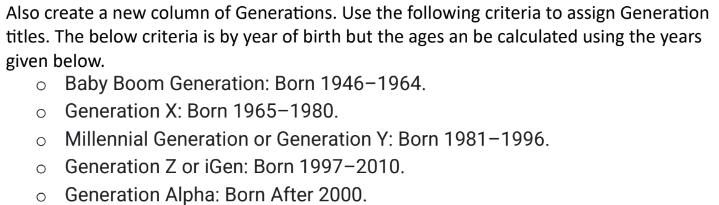

In [86]:
from datetime import datetime
currentYear = datetime.now().year
users['birth_yr'] = currentYear-users['Age']
users['Generation'] = ''
users['Generation'][(users['birth_yr']>=1946) & (users['birth_yr']<=1964)] = 'Baby Boom Generation'
users['Generation'][(users['birth_yr']>=1965) & (users['birth_yr']<=1980)] = 'Generation X'
users['Generation'][(users['birth_yr']>=1981) & (users['birth_yr']<=1996)] = 'Generation Y'
users['Generation'][(users['birth_yr']>=1997) & (users['birth_yr']<=2010)] = 'Generation Z'
users['Generation'][(users['birth_yr']>=2010)] = 'Generation Alpha'

/tmp/ipykernel_32/237831838.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users['Generation'][(users['birth_yr']>=1946) & (users['birth_yr']<=1964)] = 'Baby Boom Generation'
/tmp/ipykernel_32/237831838.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users['Generation'][(users['birth_yr']>=1965) & (users['birth_yr']<=1980)] = 'Generation X'
/tmp/ipykernel_32/237831838.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users['

Grouping different age group based on these criteria-
* Age less than 18- teenagers
* Age greater than 19 and less than 35 - Young age adult
* Age greater than 36 and less than 50 - Middle age adult
* Age greater than 50 - Old age adult

In [87]:
users['Age Group'] = ''
users['Age Group'][users['Age']<=18] = 'Teenagers'
users['Age Group'][(users['Age']>=19) & (users['Age']<=35)] = 'Young Age Adult'
users['Age Group'][(users['Age']>=36) & (users['Age']<=50)] = 'Middle Age Adult'
users['Age Group'][users['Age']>=51] = 'Old Age Adult'

/tmp/ipykernel_32/2359374049.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users['Age Group'][users['Age']<=18] = 'Teenagers'
/tmp/ipykernel_32/2359374049.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users['Age Group'][(users['Age']>=19) & (users['Age']<=35)] = 'Young Age Adult'
/tmp/ipykernel_32/2359374049.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users['Age Group'][(users['Age']>=36) & (users['Age']<=50)] = 'Mi

Dropping useless features 

In [88]:
users = users.drop(['birth_yr','Location'], axis=1)

In [89]:
# checking null values
users.isna().sum()

User-ID        0
Age            0
ISBN           0
Book-Rating    0
Country        0
State          0
City           0
Generation     0
Age Group      0
dtype: int64

However state is extracted from location filed but there can be an invalid state name so here checking valid state name and removing invalid state records

In [90]:
# list of valid state names and abbriviations in small caps
valid_states = [
    'al', 'alabama', 'ak', 'alaska', 'az', 'arizona', 'ar', 'arkansas', 'ca', 'california', 'co', 'colorado', 
    'ct', 'connecticut', 'de', 'delaware', 'fl', 'florida', 'ga', 'georgia', 'hi', 'hawaii', 'id', 'idaho', 'il', 'illinois', 
    'in', 'indiana', 'ia', 'iowa', 'ks', 'kansas', 'ky', 'kentucky', 'la', 'louisiana', 'me', 'maine', 'md', 'maryland', 
    'ma', 'massachusetts', 'mi', 'michigan', 'mn', 'minnesota', 'ms', 'mississippi', 'mo', 'missouri', 'mt', 'montana', 
    'ne', 'nebraska', 'nv', 'nevada', 'nh', 'new hampshire', 'nj', 'new jersey', 'nm', 'new mexico', 'ny', 'new york', 
    'nc', 'north carolina', 'nd', 'north dakota', 'oh', 'ohio', 'ok', 'oklahoma', 'or', 'oregon', 'pa', 'pennsylvania', 
    'ri', 'rhode island', 'sc', 'south carolina', 'sd', 'south dakota', 'tn', 'tennessee', 'tx', 'texas', 'ut', 'utah', 
    'vt', 'vermont', 'va', 'virginia', 'wa', 'washington', 'wv', 'west virginia', 'wi', 'wisconsin', 'wy', 'wyoming'
    ]
# function to check state validity
def validate_state(state):
    if state in valid_states:
        return True
    else:
        return False

# function to check if state name is in abbrivation and converting back to full form if so
def repla_abbr_state(state):
    if len(state)==2:
        return valid_states[valid_states.index(state)+1]
    else:
        return state

Before checking state validity it is important to remove spaces before and after name and then looking up in the list of states. Also abbreviation has to be converted to full form so that no repeated state name used while featurizing data

In [91]:
# additional spaces removed
users.State = users.State.str.strip()
# state validity check function called and filtered data for valid states
users = users[users.State.apply(validate_state)]
# checking if state abbreviation is used in state name if so it has to be converted to full form
# so that no repeated state name used while featurizing data
users.State = users.State.apply(repla_abbr_state)
users.State.unique()

array(['missouri', 'california', 'new york', 'colorado', 'pennsylvania',
       'tennessee', 'north carolina', 'texas', 'idaho', 'illinois',
       'michigan', 'florida', 'washington', 'hawaii', 'oregon',
       'kentucky', 'maryland', 'new jersey', 'virginia', 'indiana',
       'louisiana', 'ohio', 'minnesota', 'west virginia', 'wisconsin',
       'new hampshire', 'arkansas', 'nevada', 'oklahoma', 'rhode island',
       'alaska', 'georgia', 'maine', 'arizona', 'north dakota',
       'connecticut', 'massachusetts', 'alabama', 'mississippi', 'utah',
       'nebraska', 'iowa', 'montana', 'kansas', 'delaware', 'new mexico',
       'south carolina', 'wyoming', 'south dakota', 'vermont'],
      dtype=object)

Dropping city and country because city name can be messy and huge categorical that will lead to high dimensions and high dimensions generalizes if model distance based and country is dropped because it is filtered on usa so it is same for all rows so using it as feature is useless.

In [99]:
#users = users.drop(['City','Country'], axis=1)
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 301991 entries, 18 to 586985
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   User-ID      301991 non-null  int64  
 1   Age          301991 non-null  float64
 2   ISBN         301991 non-null  object 
 3   Book-Rating  301991 non-null  float64
 4   State        301991 non-null  object 
 5   Generation   301991 non-null  object 
 6   Age Group    301991 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 18.4+ MB


In [135]:
users['Book-Rating'] = users['Book-Rating'].astype('int16')

In [146]:
users_group = users.groupby('User-ID').head(20).sample(50000)
users_group['ISBN'].nunique()

16735

In [147]:
users_group = users_group[['User-ID','ISBN', 'Book-Rating']]
#user_rating_pvt = pd.pivot_table(users_group, values='Book-Rating', index='User-ID', columns='ISBN', fill_value=0)

In [150]:
users_without_dup = users.drop(['ISBN','Book-Rating'], axis=1).drop_duplicates()

### Feature engineering-
A model runs on numerical values so all attributes and features needs to be transformed to numerical values or vectors using various technique like one hot encoding, TF-IDF vectorization, data normalization etc

In [151]:
# one hot encoding categorical data like state, generation group, age group
state_enc = ohe()
encoded_state= state_enc.fit_transform(users_without_dup.State.values.reshape(-1,1))

gen_enc = ohe()
encoded_gen= gen_enc.fit_transform(users_without_dup.Generation.values.reshape(-1,1))

age_enc = ohe()
encoded_age= age_enc.fit_transform(users_without_dup['Age Group'].values.reshape(-1,1))

# numerical value standerdized or scaled to avoid unit difference like meter and centimeter
scaler = StandardScaler()
age = scaler.fit_transform(users_without_dup.Age.values.reshape(-1,1))

In [152]:
# printing shapes to have the idea of dimensions 
print(encoded_state.shape)
print(encoded_gen.shape)
print(encoded_age.shape)
print(age.shape)

(23295, 50)
(23295, 4)
(23295, 4)
(23295, 1)


In [153]:
# all featurized or numerically converted data merged for final input data
final_users = np.concatenate((encoded_state.toarray(),encoded_gen.toarray(),encoded_age.toarray(), age), axis=1)
final_users.shape

(23295, 59)

### Clustering
Books data clustering to group similar books. There are many algorithm for clustering like kmeans, hirarchical, DBSCAN. Here kmeans is used for clustering books data. Each book's label obtained from model is stored.

In [218]:
# Define the K-Means clustering algorithm
kmeans_u = KMeans(random_state=42, n_init='auto')

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_clusters': [200, 400, 600, 800],  # Adjust the values as desired
    'init': ['k-means++', 'random'],  # Adjust the initialization methods as desired
    'max_iter': [100, 200, 300]  # Adjust the maximum number of iterations as desired
}

# Perform grid search with cross-validation
grid_search_u = GridSearchCV(kmeans_u, param_grid, cv=3, n_jobs=-1)
grid_search_u.fit(final_users)

# Get the best hyperparameters and the best score
best_params = grid_search_u.best_params_
best_score = grid_search_u.best_score_

# Assign cluster labels to the book data using the best hyperparameters
best_kmeans = KMeans(**best_params, random_state=42)
best_kmeans.fit(final_users)
users['cluster_label'] = best_kmeans.labels_

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [1]:
user_cluster_label = best_kmeans.predict(final_users)
pvt_data['cluster_label'] = user_cluster_label

NameError: name 'cosine_similarity' is not defined

In [223]:
with open('/kaggle/working/grid_u.pkl', 'wb') as ff:
    pkl.dump(grid_search_u, ff)
    ff.close()

In [79]:
with open('/kaggle/working/kmeans_u.pkl', 'wb') as ff:
    pkl.dump(best_kmeans_u, ff)
    ff.close()

In [81]:
score = ss(final_users, best_kmeans_u.labels_)
print(score)

0.8005365491566216


In [ ]:
users_profile = best_kmeans_u.cluster_centers_
users_profile = pd.DataFrame(users_profile)
users_profile = users_profile.reset_index().rename({'index':'cluster_label'}, axis=1)
users_distance_mat = best_kmeans_u.transform(final_users)

In [94]:
from sklearn.metrics.pairwise import cosine_similarity
user_prof_similarity = cosine_similarity(users_profile, users_profile)

book_prof_similarity = cosine_similarity(book_profile, book_profile)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings; warnings.simplefilter('ignore')
from scipy import stats
from ast import literal_eval
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import linear_kernel, cosine_similarity
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import wordnet
from surprise import Reader, Dataset, SVD, evaluate
from collections import defaultdict


class hybrid(object):
    
    def __init__ (self,user_id):
        self.user_id = user_id
        with open('/kaggle/working/doc2vec.pkl') as file:
            self.doc2vec = pkl.load(file)
        with open('/kaggle/working/kmeans_b.pkl') as file:
            self.kmeans_b = pkl.load(file)
        with open('/kaggle/working/kmeans_u.pkl') as file:
            self.kmeans_u = pkl.load(file)
            
        self.book_dist_matrix = self.pre_final_book(featurized_book_data, self.kmeans_b)
        self.users_dist_matrix = self.pre_final_users(featurized_users_data, self.kmeans_u)
        
        self.collaborative_rating = self.collaborative(self.users_dist_matrix, self.user_id)
        self.content_rating = self.content_based(self.book_dist_matrix, self.user_id)
        self.final_hybrid(self.md, self.collaborative_rating, self.content_rating, self.user_id)
        

    ### Collaborative ##

    def collaborative(self, user_item_distance_matrix, targ_user_id):
        targ_user_sim_score = user_item_distance_matrix.loc[user_id]
        
        #top_3_cluster_idx = np.argsort(targ_user_sim_score)[::-1][:3]
        top_3_cluster_score = np.sort(targ_user_sim_score)[::-1][:3]
        return(top_3_cluster_score)


    ##### CONTENT ######

    def content_based(self, book_distance_matrix, targ_user_id):
        targ_content_sim_score = book_distance_matrix.loc[targ_user_id]
        
        top_3_cluster_score = np.sort(targ_content_sim_score)[::-1][:3]
        
        return(top_3_cluster_score)

    
    def final_hybrid(self,book_data, self.collaborative_rating, self.content_rating, targ_user_id):

        hyb = book_data[['book_id']]
        title = book_data[['book_id','title', 'Genres']]

        hyb = hyb.merge(title,on = 'book_id')
        hyb = hyb.merge(self.collaborative_rating,on = 'book_id')
        hyb = hyb.merge(self.content_rating, on='book_id')

        def weighted_rating(x):
            v = x['rating']
            R = x['popularity_rating']
            c = x['content_rating']
            return 0.65*v + 0.35 * c

        hyb['hyb_rating'] = hyb.apply(weighted_rating, axis=1)
        hyb = hyb.sort_values('hyb_rating', ascending=False).head(999)
        hyb.columns = ['Book ID' , 'Title', 'Genres', 'Collaborative Rating', 'Popularity Rating' , 'Content Rating', 'Hybrid Rating']

        #print(len(hyb['Hybrid Rating']))
        print(hyb)

    def pre_final_book(featurized_book_data, kmeans):
        book_dist_matrix = kmeans.transform(featurized_book_data.iloc[:,:-1])
        book_dist_matrix['cluster_label'] = featurized_book_data.iloc[:,-1]

    return book_dist_matrix

    def pre_final_users(featurized_users_data, kmeans):
        users_dist_matrix = kmeans.transform(featurized_users_data.iloc[:,:-1])
        users_dist_matrix['cluster_label'] = featurized_users_data.iloc[:,-1]

    return users_dist_matrix

def newUser():
    
    return
    
    
        

print("------------------------------Welcome to the Book Recommendation Engine---------------------------\n")

user=raw_input("1. Book Recommendation for New User. \n2. Book Recommendation for Existing User.\n")

if user=='1':
    newUser()
    
elif user=='2':
    userId=int(raw_input("\nPlease Enter User Id: "))
    print('\n----------------Welcome User'+str(userId)+'-------------------')
    h = hybrid(userId,ratings)
    
else:
    print("Invalid option\n ")

## Evaluation

In [ ]:
from mean_average_precision import MetricBuilder
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

def map(relatable, recommended):

    # create metric_fn
    metric_fn = MetricBuilder.build_evaluation_metric("map_2d", async_mode=True, num_classes=1)

    # add some samples to evaluation
    for i in range(10):
        metric_fn.add(recommended, relatable)

    # compute metric COCO metric
    map = metric_fn.value(iou_thresholds=np.arange(0.5, 1.0, 0.05), recall_thresholds=np.arange(0., 1.01, 0.01), mpolicy='soft')['mAP']
    return map

def evaluation(recomended_set):
    print("mAP score: ", map(recommended_set[0], recommended_set[1]))
    print("Precision score: ", precision_score(recommended_set[0], recommended_set[1]))
    print("Recall score: ", recall_score(recommended_set[0], recommended_set[1]))
    
rec_set = hybrid(users[['User-ID']].sample[1])
recommended_set = [original_set, rec_set]
evaluation(recommended_set)